# Forecasting Home Prices in Austin, TX Using Time-Series Data

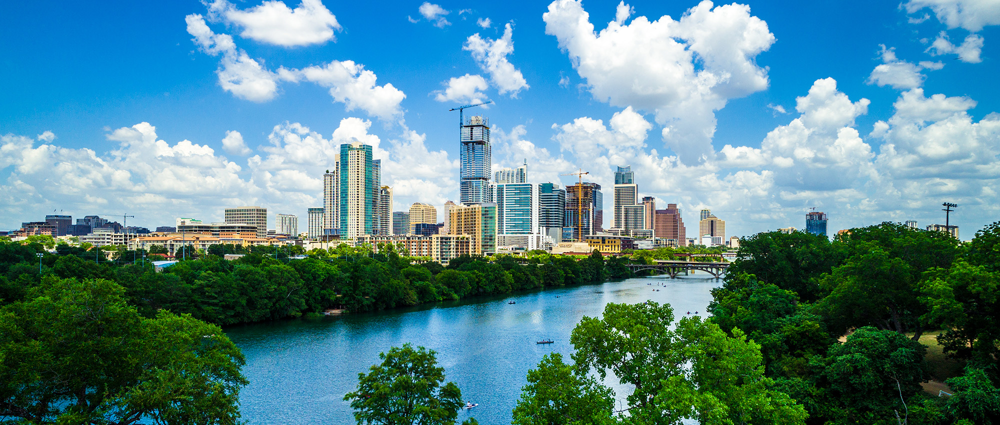

Austin, TX is the fastest growing city in the country. [From 2019 to 2020, the city saw its population grow by 3%, the largest among metropolitan areas with at least 1 million people.](https://www.bizjournals.com/austin/news/2021/05/04/census-data-austin-metro-population.html). As a consultant for an Austin-based real estate investment firm, I will be advising on what 5 zip codes to invest their money in. For the purposes of accurate forecasting, we'll be forecasting 2-year growth rates, using predicted prices for 2018 and 2019.

What makes a zip code a top 5 zip code? For this firm, it's pure growth rate. The higher the growth rate, the better. With such a short time horizon, the firm is willing to take big swings to produce higher returns for their investors. Using monthly data from 2010 - 2017, we'll create a time series model to help us forecast what prices would be in 2018 and 2019. The zip codes with the highest growth from 2017 to 2019 will be the optimal investments for this firm.

We'll also explore the housing market in the broader metro area, and look at how Austin prices and growth compares to other major cities.

## Step 1: Load the Data/Filtering for Chosen Zipcodes

In [1]:
#importing libraries
import pandas as pd
import numpy as np
import itertools
import warnings
import json
warnings.filterwarnings('ignore')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
plt.style.use('ggplot')
import seaborn as sns

import plotly as py
import plotly.express as px
import plotly.graph_objects as go

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

import pmdarima as pm
from pmdarima.arima import auto_arima
from pmdarima import model_selection
from pmdarima.utils import decomposed_plot
from pmdarima.arima import decompose

!pip install folium
import folium

In [23]:
df = pd.read_csv('zillow_data.csv')

#renaming region name column to zipcode
df.rename({'RegionName': 'Zipcode'}, axis='columns', inplace=True)
df.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14723 entries, 0 to 14722
Columns: 272 entries, RegionID to 2018-04
dtypes: float64(219), int64(49), object(4)
memory usage: 30.6+ MB


Our Zillow data has nearly 15K zipcodes, accounting for about 35% of the total number of zipcodes in the U.S. The data captures the median home sale price for each month from April 1996 - April 2018. To get a clearer picture and to make data processing easier, I'll drop 1996 and 2018 so I only have complete years in the data set.

## Step 2: Data Exploration

In [4]:
#creating austin dataframe, also filtering by state because there are some Austins in other states
austin = df.loc[(df['City'] == 'Austin') & (df['State'] == 'TX')]
austin.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
66,92617,78704,Austin,TX,Austin,Travis,67,221300.0,221100.0,221000.0,...,530100,532400,534200,536200,538200,539800,540200,542300,547100,550900
98,92654,78745,Austin,TX,Austin,Travis,99,135000.0,134200.0,133800.0,...,286300,286900,287500,288700,289800,290500,291300,292600,294000,294700
422,92667,78758,Austin,TX,Austin,Travis,423,129000.0,128300.0,127500.0,...,250000,248400,247500,247400,247900,250500,255100,260100,266000,270400
432,92651,78741,Austin,TX,Austin,Travis,433,93800.0,93600.0,93500.0,...,228000,226700,227600,230200,234100,238300,241000,243600,247400,250400
502,92662,78753,Austin,TX,Austin,Travis,503,111300.0,110600.0,109900.0,...,222600,223200,223600,223100,223100,225000,227100,228700,231500,233400


In [5]:
#let's see how many zipcodes in Austin there are:

print('# of Zipcodes in Austin, TX: ', austin['Zipcode'].nunique())

# of Zipcodes in Austin, TX:  38


In [6]:
def melt_data(df, time_series = None):
    '''
    The melt data method is essentially a pivot table. Since our monthly data is in the columns,
    melting the data moves each date into its own row and aggregates the median home prices by the mean.
    When time_series is set to 'yes', the data is transformed into strictly a time series dataframe, meaning
    that it only has dates and the average median home price. Setting the parameter to 'None' allows us to
    retain the other columns, like zipcode
    '''
    melted = pd.melt(df, id_vars=['RegionID','Zipcode', 'City', 'State', 'Metro', 'CountyName', 'SizeRank'], var_name='time')
    melted['time'] = pd.to_datetime(melted['time'], infer_datetime_format=True)
    melted = melted.dropna(subset=['value'])
    if time_series == 'yes':
        return melted.groupby('time').aggregate({'value':'mean'})
    else:
        return melted

In [7]:
#austin_df will retain categorical info
austin_df = melt_data(austin)
austin_df.rename(columns = {'time':'date','value':'median_sale_price'}, inplace = True)
austin_df.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,date,median_sale_price
0,92617,78704,Austin,TX,Austin,Travis,67,1996-04-01,221300.0
1,92654,78745,Austin,TX,Austin,Travis,99,1996-04-01,135000.0
2,92667,78758,Austin,TX,Austin,Travis,423,1996-04-01,129000.0
3,92651,78741,Austin,TX,Austin,Travis,433,1996-04-01,93800.0
4,92662,78753,Austin,TX,Austin,Travis,503,1996-04-01,111300.0


In [8]:
#austin_ts will just be used to look at time series aggregation
austin_ts = melt_data(austin, time_series = 'yes')
austin_ts.rename(columns = {'value':'median_sale_price'}, inplace = True)
austin_ts.head()

,median_sale_price
time,
1996-04-01,217871.052632
1996-05-01,217673.684211
1996-06-01,217610.526316
1996-07-01,217657.894737
1996-08-01,217792.105263


In [9]:
#Let's look at the overall trend of the avg. median sale price
fig = px.line(austin_ts, x=austin_ts.index, y = 'median_sale_price',
             title = 'Avg. Median Sale Price in Austin, TX')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

Interestingly, from its pre-recession peak, the average median sale price of homes in Austin only fell by 20K at its lowest during the crisis. Although affected, prices were much less impacted here than in many other metropolitan areas. Since hitting a low in June 2011, prices have been rising rapidly, increasing by 56% between 06/2011 and 04/2018.

Now let's look at a box plot of prices from 1997 - 2017:

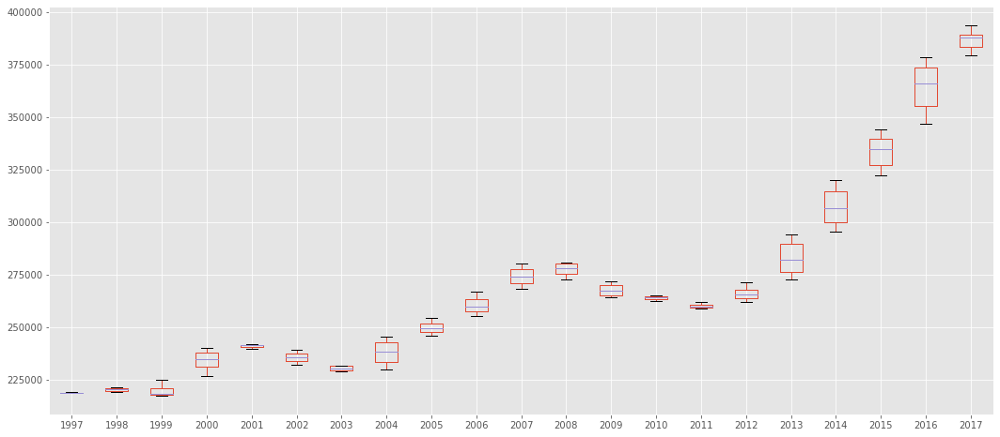

In [10]:
#both 1996 and 2018 only start in April, let's slice those off from our dataset
austin_ts_slice = austin_ts['1997':'2017']

#try making an annual box plot here as well
year_groups = austin_ts_slice.groupby(pd.Grouper(freq = 'A'))

austin_ts_annual = pd.DataFrame()

for yr, group in year_groups:
    austin_ts_annual[yr.year] = group.values.ravel()
    
austin_ts_annual.boxplot(figsize = (18,8))

In [11]:
#Let's see how average price has increased in Austin from 2011 to 2017
(austin_ts_annual[2017].mean() - austin_ts_annual[2011].mean())/austin_ts_annual[2011].mean()

0.488396361071837

Over the years, we can see that the range of prices decreases in down years. In 1997 - 1998, 2001 - 2003, and 2009 - 2011, the boxplots are much smaller in size compared to growth years. Prices across the board are clearly affected in recessions, while the top end of home prices take off in years the market is growing. Overall, we see that prices increased by almost 43% from 2011 - 2017

## Data Exploration: Comparing other cities in the Austin Metro area

Let's look at other cities in the Austin metro area to see if prices behave similarly.

In [12]:
austin_metro_df = df[(df['Metro'] == 'Austin') & (df['State'] == 'TX')]
austin_metro_df.reset_index(inplace = True)
austin_metro_df.drop(columns = 'index', inplace = True)
austin_metro_df.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,92593,78660,Pflugerville,TX,Austin,Travis,19,138900.0,138600.0,138400.0,...,235000,235900,236600,237400,238500,239400,240000,241000,242200,242800
1,92551,78613,Cedar Park,TX,Austin,Williamson,33,169600.0,169000.0,168600.0,...,291400,291700,292700,294400,295800,296200,295900,296400,297500,297300
2,92617,78704,Austin,TX,Austin,Travis,67,221300.0,221100.0,221000.0,...,530100,532400,534200,536200,538200,539800,540200,542300,547100,550900
3,92598,78666,San Marcos,TX,Austin,Hays,78,103100.0,103000.0,103000.0,...,193400,193200,193600,195200,196900,197500,197900,200100,203800,206500
4,92654,78745,Austin,TX,Austin,Travis,99,135000.0,134200.0,133800.0,...,286300,286900,287500,288700,289800,290500,291300,292600,294000,294700


In [13]:
#let's compare to 5 largest cities in metro area, excluding Austin
austin_metro_sorted = austin_metro_df.sort_values('SizeRank')
austin_metro_sorted = austin_metro_sorted[austin_metro_sorted['City'] != 'Austin']

In [14]:
austin_metro_sorted.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,92593,78660,Pflugerville,TX,Austin,Travis,19,138900.0,138600.0,138400.0,...,235000,235900,236600,237400,238500,239400,240000,241000,242200,242800
1,92551,78613,Cedar Park,TX,Austin,Williamson,33,169600.0,169000.0,168600.0,...,291400,291700,292700,294400,295800,296200,295900,296400,297500,297300
3,92598,78666,San Marcos,TX,Austin,Hays,78,103100.0,103000.0,103000.0,...,193400,193200,193600,195200,196900,197500,197900,200100,203800,206500
5,92576,78641,Leander,TX,Austin,Williamson,284,153600.0,152900.0,152400.0,...,246700,247500,248100,249000,250200,251200,251900,252800,253700,254100
10,92597,78664,Round Rock,TX,Austin,Williamson,515,133100.0,132700.0,132400.0,...,206500,206600,206600,207300,208600,209600,210400,212100,214900,217300


So our top 5 cities ranked by size, excluding Austin are:

- 1) Pflugerville
- 2) Cedar Park
- 3) San Marcos
- 4) Leander
- 5) Round Rock

In [15]:
top_5 = ['Pflugerville', 'Cedar Park', 'San Marcos', 'Leander', 'Round Rock']

austin_metro_sorted_top5 = austin_metro_sorted[austin_metro_sorted['City'].isin(top_5)]

In [16]:
Pflugerville = austin_metro_sorted_top5.loc[austin_metro_sorted_top5['City'] == 'Pflugerville']
Cedar_Park = austin_metro_sorted_top5.loc[austin_metro_sorted_top5['City'] == 'Cedar Park']
San_Marcos = austin_metro_sorted_top5.loc[austin_metro_sorted_top5['City'] == 'San Marcos']
Leander = austin_metro_sorted_top5.loc[austin_metro_sorted_top5['City'] == 'Leander']
Round_Rock = austin_metro_sorted_top5.loc[austin_metro_sorted_top5['City'] == 'Round Rock']

In [17]:
melt_Pflugerville = melt_data(Pflugerville, time_series = 'yes')
melt_Cedar_Park = melt_data(Cedar_Park, time_series = 'yes')
melt_San_Marcos = melt_data(San_Marcos, time_series = 'yes')
melt_Leander = melt_data(Leander, time_series = 'yes')
melt_Round_Rock = melt_data(Round_Rock, time_series = 'yes')

In [18]:
def line_chart(ts):
    fig = px.line(ts, x=ts.index, y = ts['value'], title = 'Avg. Median Sale Price')
    fig.update_xaxes(rangeslider_visible=True)
    fig.show()

In [280]:
plot_dict = {'Pflugerville':melt_Pflugerville, 'Cedar_Park':melt_Cedar_Park, 'San_Marcos':melt_San_Marcos, 'Leander':melt_Leander, 'Round_Rock':melt_Round_Rock}
for key, val in plot_dict.items():
    print('City: ', key)
    line_chart(val)

City:  Pflugerville


City:  Cedar_Park


City:  San_Marcos


City:  Leander


City:  Round_Rock


We see that these 5 cities have larger drops in the 2003-2004 recession than Austin did. However, the increases post-2011 are of the same relative magnitude as Austin:

## Percentage Growth from 2011 - 2017: Top 5 Cities by Size

- Cedar Park: 47%
- Leander: 46.5%
- Round Rock: 42.6%
- Pflugerville: 39%
- San Marcos: 38.5%

These compare favorably to Austin in general, which increased by 42.6% from 2011 - 2017. Although the prices in these cities don't reach the top prices in Austin, we can see that the growth in Austin has spurred growth in the surrounding cities in the metropolitan area.

## Data Exploration: Comparing Austin to other major cities

It might also be useful to compare Austin's housing market to other big and growing cities across the country. Has Austin performed as well as others? Was it affected more or less by the recession than other big cities?

In [24]:
nyc = df.loc[df['City'] == 'New York']
dc = df.loc[df['State'] == 'DC']
sf = df.loc[df['City'] == 'San Francisco']
la = df.loc[df['City'] == 'Los Angeles']

melt_nyc = melt_data(nyc, time_series = 'yes')
melt_dc = melt_data(dc, time_series = 'yes')
melt_sf = melt_data(sf, time_series = 'yes')
melt_la = melt_data(la, time_series = 'yes')

In [25]:
line_chart(melt_nyc)

In [26]:
line_chart(melt_dc)

In [27]:
line_chart(melt_sf)

In [28]:
line_chart(melt_la)

Austin certainly has a similar trend to these other cities, but the drop appears to be much less significant.

In [29]:
melt_la.rename(columns = {'value':'median_sale_price'}, inplace = True)
melt_dc.rename(columns = {'value':'median_sale_price'}, inplace = True)
melt_nyc.rename(columns = {'value':'median_sale_price'}, inplace = True)
melt_sf.rename(columns = {'value':'median_sale_price'}, inplace = True)

In [30]:
year_group_dict = {'LA': melt_la, 'DC': melt_dc, 'NYC': melt_nyc, 'SF': melt_sf, 'Austin': austin_ts}
for key, val in year_group_dict.items():
    sliced = val['1997':'2017']
    year_groups_mean = sliced.groupby(pd.Grouper(freq = 'A')).mean()
    year_groups_mean['YoY_%_Change'] = year_groups_mean['median_sale_price'].pct_change()*100
    year_groups_mean['YoY_%_Change'][1:] = year_groups_mean['YoY_%_Change'][1:].astype('int64')
    
    fig = px.bar(year_groups_mean, x=year_groups_mean.index, y='YoY_%_Change', title = key, color = 'YoY_%_Change')
    fig.show()

All cities had some decline in growth during the recession besides NYC, which saw prices essentially hold steady. The other 4 major cities had rebounds orders of magnitude larger than Austin on a YoY basis, but Austin prices are clearly growing, and there will be more room to go in the coming years. DC, a smaller city closer to Austin's population, had similar YoY growth rates since 2011, averaging about 7% for the last 6 years in the dataset, which is roughly what Austin saw.

## Preparing to Model

Now that we've explored the data, let's dive into time series modeling and figuring out we can find the 5 best zipcodes in Austin to invest in. As the investment firm is only looking to invest for 2 years, they simply want the 5 zipcodes with the highest projected 2 year growth rates, regardless of risk. To get started, let's first look at the distribution of our time series data.

In [31]:
fig = px.histogram(austin_ts, x='median_sale_price',
                  title = 'Median Price Distribution')
fig.show()

Our data is skewed to the right so we don't have a normally distributed dataset. Prior to modeling, we'll need to log transform this data to make it more normal.

Next, let's see if our data is stationary or not. Time series models assume that your data is stationary, so it's important we can get a constant mean across all time periods.

In [32]:
roll_mean = austin_ts.rolling(window = 6, center = False).mean()
roll_std = austin_ts.rolling(window = 6, center = False).std()

fig = go.Figure()
fig.add_trace(go.Scatter(x=austin_ts.index, y=austin_ts['median_sale_price'],
                    mode='lines',
                    name='Original'))
fig.add_trace(go.Scatter(x=roll_mean.index, y=roll_mean['median_sale_price'],
                    mode='lines',
                    name='Rolling Mean'))
fig.add_trace(go.Scatter(x=roll_std.index, y=roll_std['median_sale_price'],
                    mode='lines', name='Rolling Std. Deviation'))

fig.show()

There's certainly a trend in our data, and the rolling mean isn't constant, implying that this is non-stationary data. Let's use a Dickey-Fuller test to confirm.

In [33]:
def stationarity_test(ts):
    '''
    Courtesy of Lindsey Berlin.
    This function takes in a time series dataframe and performs a Dickey-Fuller test.
    The null hypothesis is that the data is non-stationary, so when we can reject the null using the p-value,
    we have stationary data.
    '''
    dftest = adfuller(ts)

    dfoutput = pd.Series(dftest[0:4], index = ['Test Statistic', 'p-value', '#lags used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)' %key] = value
    print('Results of Dickey-Fuller test: \n')

    return print(dfoutput)

In [34]:
austin_ts = austin_ts['1997': '2017']
stationarity_test(austin_ts)

Results of Dickey-Fuller test: 

Test Statistic                   0.632548
p-value                          0.988391
#lags used                      15.000000
Number of Observations Used    236.000000
Critical Value (1%)             -3.458366
Critical Value (5%)             -2.873866
Critical Value (10%)            -2.573339
dtype: float64


Our p-value here is much greater than the .05 cutoff, meaning that we fail to reject the null hypothesis that this data is non-stationary.

Let's decompose our time series to identify the seasonality from the overall trend.

In [35]:
def decompose(ts, model = 'additive'):
    '''
    This function takes in a time series dataframe and runs the statsmodels decomposition function on it,
    while also graphing our results.
    
    Inputs: ts = time series
            model = 'additive' or 'multiplicative'
    Output: 4 graphs illustrating the trend, seasonality, and residuals
    '''
    
    decomposition = sm.tsa.seasonal_decompose(ts, model=model)
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid


    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.plot(ts, label='Original', color='blue')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color='blue')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality', color='blue')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color='blue')
    plt.legend(loc='best')
    plt.tight_layout()

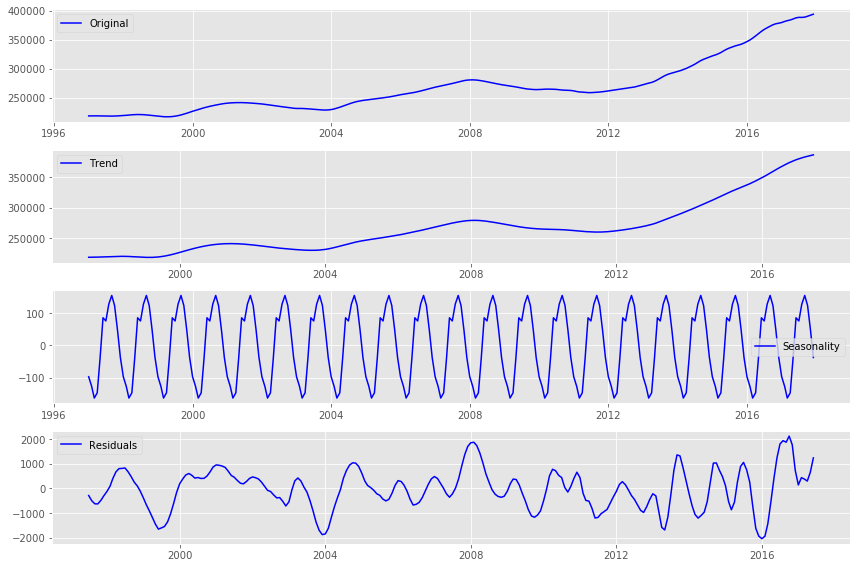

In [36]:
decompose(austin_ts)

We can see a clear upward trend as well as consistent seasonality every year. Although judging by the actual trend line, the seasonality does not appear to be significant.

Next, I'll use a pivot table to move each zipcode to its own column

In [37]:
austin_ts2 = austin_df.copy()
austin_ts2['date'] = pd.to_datetime(austin_ts2['date'])
austin_ts2.set_index('date', inplace = True)
austin_ts2.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,median_sale_price
date,,,,,,,,
1996-04-01,92617,78704,Austin,TX,Austin,Travis,67,221300.0
1996-04-01,92654,78745,Austin,TX,Austin,Travis,99,135000.0
1996-04-01,92667,78758,Austin,TX,Austin,Travis,423,129000.0
1996-04-01,92651,78741,Austin,TX,Austin,Travis,433,93800.0
1996-04-01,92662,78753,Austin,TX,Austin,Travis,503,111300.0


In [38]:
austin_zip = austin_ts2.pivot_table(index = 'date', columns = 'Zipcode', values = 'median_sale_price', aggfunc = 'mean')
austin_zip.columns = austin_zip.columns.astype(str)
austin_zip.head()

Zipcode,78617,78702,78703,78704,78705,78717,78721,78722,78723,78724,...,78749,78750,78751,78752,78753,78754,78756,78757,78758,78759
date,,,,,,,,,,,,,,,,,,,,,
1996-04-01,121900.0,55600.0,355200.0,221300.0,197500.0,200800.0,69200.0,76200.0,97600.0,97500.0,...,264000.0,266200.0,115900.0,87200.0,111300.0,133100.0,194900.0,150300.0,129000.0,266400.0
1996-05-01,120500.0,56700.0,351300.0,221100.0,199300.0,200400.0,68800.0,76400.0,99000.0,96900.0,...,266400.0,267800.0,116900.0,87000.0,110600.0,132900.0,196500.0,150900.0,128300.0,269000.0
1996-06-01,119000.0,57900.0,347800.0,221000.0,201000.0,200500.0,68400.0,76500.0,100300.0,96200.0,...,269300.0,269500.0,118000.0,86800.0,109900.0,132800.0,198100.0,152100.0,127500.0,272000.0
1996-07-01,117400.0,59300.0,344900.0,221000.0,202700.0,201100.0,68100.0,76700.0,101400.0,95600.0,...,272400.0,271100.0,119100.0,86700.0,109200.0,132600.0,199700.0,153600.0,126900.0,275100.0
1996-08-01,116000.0,60800.0,342400.0,221300.0,204300.0,202300.0,67800.0,77000.0,101900.0,95100.0,...,275500.0,272600.0,120200.0,86500.0,108600.0,132500.0,201200.0,155300.0,126300.0,278200.0


In [39]:
fig = go.Figure()

for col in austin_zip.columns:
    fig.add_trace(go.Scatter(x=austin_zip.index, y=austin_zip[col],
                        mode='lines',
                        name='{col}'.format(col=col)))
fig.show()

We see two zipcodes, 78746 and 78703, that have far higher average median prices than all the rest. The two zipcodes also seem to have the steepest line, illustrating that they're experiencing high growth. It will be interesting to see if the model shows these two to be in the top 5.

We'll most likely have to log transform this data, but let's first see how differencing affects the stationarity.

## Removing Stationarity

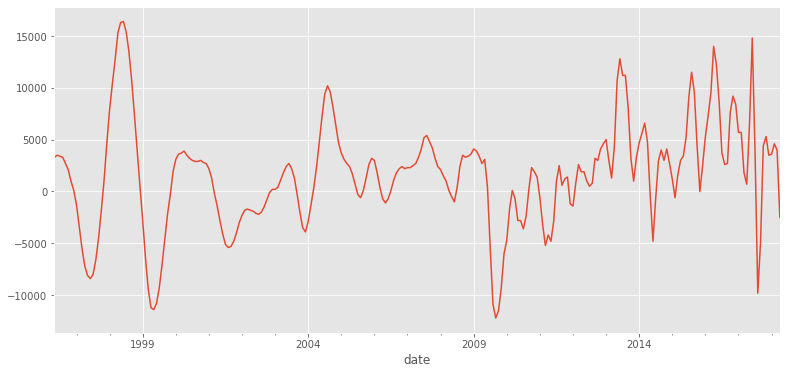

In [40]:
#using our top zipcode from observed data
austin_78746 = austin_zip['78746']
austin_78746_diff = austin_78746.diff(periods = 1)
austin_78746_diff.dropna(inplace = True)

plt.figure(figsize = (13, 6))
austin_78746_diff.plot()

In [41]:
#plotting the rolling mean and standard deviation with a window of 6
roll_mean_78746 = austin_78746_diff.rolling(window = 6, center = False).mean()
roll_std_78746 = austin_78746_diff.rolling(window = 6, center = False).std()

fig = go.Figure()
fig.add_trace(go.Scatter(x=austin_78746_diff.index, y=austin_78746_diff.values,
                    mode='lines',
                    name='Original'))
fig.add_trace(go.Scatter(x=roll_mean_78746.index, y=roll_mean_78746.values,
                    mode='lines',
                    name='Rolling Mean'))
fig.add_trace(go.Scatter(x=roll_mean_78746.index, y=roll_std_78746.values,
                    mode='lines', name='Rolling Std. Deviation'))

fig.show()

In [42]:
stationarity_test(austin_78746_diff)

Results of Dickey-Fuller test: 

Test Statistic                  -3.203893
p-value                          0.019760
#lags used                      14.000000
Number of Observations Used    249.000000
Critical Value (1%)             -3.456888
Critical Value (5%)             -2.873219
Critical Value (10%)            -2.572994
dtype: float64


We see with this stationarity test that one-period differencing is enough to create a stationary dataset, which is encouraging. When modeling, we'll be sure to have a differencing of 1 in our logged dataset.

## Autocorrelation and Partial Autocorrelation

Autocorrelation and Partial Autocorrelation is used to illustrate how time lags are correlated with each other. If we see a spike at 12 lags, this might tell us that the data has a yearly seasonal relationship. For example, housing prices in June 2020 could be very correlated with June 2019 prices. This information can help us with deciding what parameters to use in our ARIMA models.

We'll use this undifferenced dataframe to see what the autocorrelation looks like.

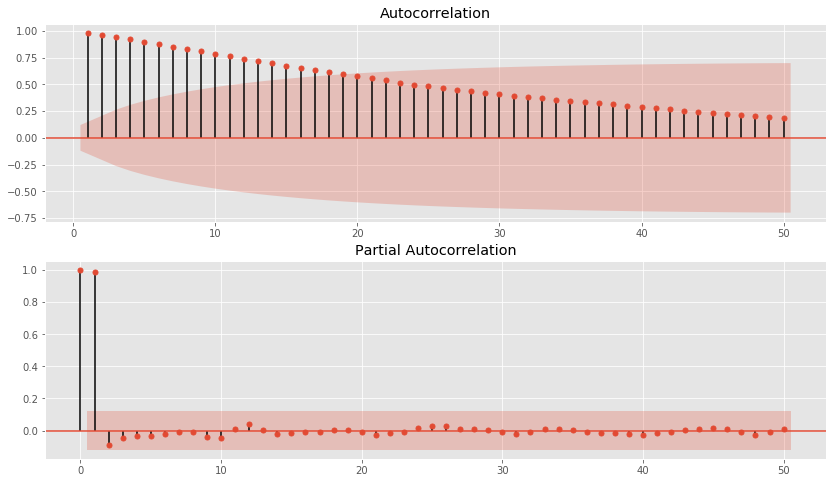

In [43]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(14,8))

#ACF
plot_acf(austin_78746, lags=50, zero=False, ax=ax1)

#PACF
plot_pacf(austin_78746,lags=50, ax=ax2)
plt.show()

In the autocorrelation plot, up to about 18 lags, there is meaningful correlation amongst time lags. Partial autocorrelation shows correlation only at 1 and 2 lags. In our model, 1 might be our best autoregressive term.

# SARIMAX Modeling

Now, we'll use SARIMA model to forecast future home prices to estimate what growths rate will be.

In [265]:
from sklearn import metrics

#first, let's import our reporting metrics
#function courtesy of Lindsey Berlin

def report_metrics(y_true, y_pred, print_ = None):
    if print_ == 'yes':
        print("Explained Variance: ", metrics.explained_variance_score(y_true, y_pred))
        print("MAE: ", np.exp(metrics.mean_absolute_error(y_true, y_pred)))
        print("RMSE: ", np.exp(metrics.mean_squared_error(y_true, y_pred, squared=False)))
        print("r^2: ", metrics.r2_score(y_true, y_pred))
    return metrics.explained_variance_score(y_true, y_pred), np.exp(metrics.mean_absolute_error(y_true, y_pred)),np.exp(metrics.mean_squared_error(y_true, y_pred, squared=False)),metrics.r2_score(y_true, y_pred)


To get more accurate results and to not be overly influenced by fluctuations due to the recession, we're going to use data only in the years 2010 - 2017. To begin, we'll use a logged series for just the time series for the 78746 zipcode, and if it works, we'll extrapolate that model to the rest of the zipcodes in Austin.

In [45]:
austin_78746_2010 = austin_78746['2010': '2017']
austin_78746_2010 = austin_78746_2010.resample('MS').mean()
austin_78746_2010_log = np.log(austin_78746_2010)

In [392]:
#Define the p, d and q parameters to take any value between 0 and 3
#this takes a long time to run - change back to 3
p = d = q = range(0, 3)

#Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

#Generate all different combinations of seasonal p, q and q triplets
pdqs = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

In [270]:
#I found thi resulted in better parameters than the out-of-the-box auto arima function
#adding in trend t to see if I get different parameters
def pdq_test(ts):
    '''
    This function takes in a time series and performs a grid search to find the best order and seasonal order
    for the p, d, and q parameters. It's best to use unaltered data here because it will find the right
    parameters to deal with non-stationarity and seasonality.
    
    Input: Time-series
    Output: Optimal combination for order and seasonal order
    
    Function courtesy of Flatiron
    '''
    ans = []
    for comb in pdq:
        for combs in pdqs:
            try:
                mod = sm.tsa.statespace.SARIMAX(ts,
                                                order=comb,
                                                seasonal_order=combs,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False,
                                                #trend = t to account for linear relationship with time
                                                trend = 't',
                                                error_action = 'ignore')

                output = mod.fit()
                ans.append([comb, combs, output.aic])
                print('ARIMA {} x {}12 : AIC Calculated ={}'.format(comb, combs, output.aic))
            except:
                continue
    # Find the parameters with minimal AIC value
    ans_df = pd.DataFrame(ans, columns=['pdq', 'pdqs', 'aic'])
    
    return ans_df.loc[ans_df['aic'].idxmin()]

In [386]:
answer = pdq_test(austin_78746_2010_log)

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =630.980453186448
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =519.2267841383804
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =-311.70383764711573
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =-266.9111770560815
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =-316.61854024559074
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =-335.3544283944632
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =-277.8766636400964
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =-267.89103465770876
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated =624.3252809587774
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated =513.8518010596276
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated =-403.78435780077183
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated =-353.568427835387
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated =-313.63832097531997
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated =-279.90733599467467
ARIMA 

In [222]:
def arima_fit(ts, order = (1,1,1), seasonal_order = (1,1,1,12), plot = None):
    '''
    Using the best parameters from the pdq_test for order and seasonal order, this function will fit a model
    onto our time series data.
    
    Inputs: Time-series
            Order
            Seasonal order
    Output: Output from fitting SARIMAX model
    '''
    ARIMA_MODEL = sm.tsa.statespace.SARIMAX(ts, 
                                        order=order, 
                                        seasonal_order=seasonal_order, 
                                        enforce_stationarity=False, 
                                        enforce_invertibility=False,
                                            #trend = t to account for linear relationship with time
                                            trend = 't',
                                           error_action = 'ignore')

    # Fit the model and print results
    output = ARIMA_MODEL.fit()
    
    if plot =='yes':

        print(output.summary().tables[1])

        output.plot_diagnostics(figsize=(15, 18))
        plt.show()
    
    return output

In [271]:
def dynamic_predictions(output, ts, time = '2016-01-01', plot = None):
    '''
    This function attempts to predict future years data. The default is 2 years (2016 and 2017)
    Inputs: Output from model
            Time-series
            time (date at which the model begins to make predictions - 2016 implies 2 years)
    Output: Forecast
            Scoring metrics
    '''
    
    pred = output.get_prediction(start=pd.to_datetime(time), dynamic=True, full_results = True)
    pred_conf = pred.conf_int()
    
    if plot == 'yes':
        
        rcParams['figure.figsize'] = 15, 6
    
    

        # Plot observed values
        ax = ts['2010':].plot(label='observed')

        # Plot predicted values
        pred.predicted_mean.plot(ax=ax, label='Dynamic Forecast', alpha=0.9)

        # Plot the range for confidence intervals
        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color='g', alpha=0.5)

        # Set axes labels
        ax.set_xlabel('Date')
        ax.set_ylabel('Avg. Median Sale Price')
        plt.legend()

        plt.show()
    
    
    #Get the real and predicted values
    austin_forecasted = pred.predicted_mean
    austin_truth = ts['2016-01-01':]

    return pred, austin_forecasted, austin_truth

In [272]:
pdq_test(austin_78746_2010_log)

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =630.980453186448
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =519.2267841383804
ARIMA (0, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1907.019983329999
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =-311.70383764711573
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =-266.9111770560815
ARIMA (0, 0, 0) x (0, 1, 2, 12)12 : AIC Calculated =1914.6182150595698
ARIMA (0, 0, 0) x (0, 2, 0, 12)12 : AIC Calculated =-200.19575836832905
ARIMA (0, 0, 0) x (0, 2, 1, 12)12 : AIC Calculated =-171.93011923967376
ARIMA (0, 0, 0) x (0, 2, 2, 12)12 : AIC Calculated =-161.40093384562576
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =-316.61854024559074
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =-335.3544283944632
ARIMA (0, 0, 0) x (1, 0, 2, 12)12 : AIC Calculated =1851.8707650532501
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =-277.8766636400964
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =-267.89103465770876
ARIM

ARIMA (0, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-317.4694000596182
ARIMA (0, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-656.2542848164233
ARIMA (0, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-644.569553965831
ARIMA (0, 1, 1) x (1, 0, 2, 12)12 : AIC Calculated =2826.9227253396475
ARIMA (0, 1, 1) x (1, 1, 0, 12)12 : AIC Calculated =-540.9539632703049
ARIMA (0, 1, 1) x (1, 1, 1, 12)12 : AIC Calculated =-521.4292873930644
ARIMA (0, 1, 1) x (1, 1, 2, 12)12 : AIC Calculated =2425.469517585818
ARIMA (0, 1, 1) x (1, 2, 0, 12)12 : AIC Calculated =-409.7400593615017
ARIMA (0, 1, 1) x (1, 2, 1, 12)12 : AIC Calculated =-401.4330280233898
ARIMA (0, 1, 1) x (1, 2, 2, 12)12 : AIC Calculated =-316.5850041898801
ARIMA (0, 1, 1) x (2, 0, 0, 12)12 : AIC Calculated =-559.3473888817067
ARIMA (0, 1, 1) x (2, 0, 1, 12)12 : AIC Calculated =-547.0633148107465
ARIMA (0, 1, 1) x (2, 0, 2, 12)12 : AIC Calculated =2827.471929104806
ARIMA (0, 1, 1) x (2, 1, 0, 12)12 : AIC Calculated =-443.49095517530003
ARIMA (0

ARIMA (0, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-369.8703389094597
ARIMA (0, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-262.5181851180312
ARIMA (0, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-555.045153397606
ARIMA (0, 2, 2) x (2, 0, 1, 12)12 : AIC Calculated =-551.6562444989703
ARIMA (0, 2, 2) x (2, 0, 2, 12)12 : AIC Calculated =2084.326808108381
ARIMA (0, 2, 2) x (2, 1, 0, 12)12 : AIC Calculated =-437.16143070976864
ARIMA (0, 2, 2) x (2, 1, 1, 12)12 : AIC Calculated =-433.7903231520615
ARIMA (0, 2, 2) x (2, 1, 2, 12)12 : AIC Calculated =2789.013621524077
ARIMA (0, 2, 2) x (2, 2, 0, 12)12 : AIC Calculated =-329.1125519540015
ARIMA (0, 2, 2) x (2, 2, 1, 12)12 : AIC Calculated =-324.6770404341975
ARIMA (0, 2, 2) x (2, 2, 2, 12)12 : AIC Calculated =-260.47835904247034
ARIMA (1, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =-709.0194012785657
ARIMA (1, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =-602.7361435621218
ARIMA (1, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1910.3577458287723
ARIMA (

ARIMA (1, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-320.5979645019563
ARIMA (1, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-319.98730464346477
ARIMA (1, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-270.9051672403488
ARIMA (1, 1, 1) x (0, 0, 0, 12)12 : AIC Calculated =-785.2743954986333
ARIMA (1, 1, 1) x (0, 0, 1, 12)12 : AIC Calculated =-661.8956528368352
ARIMA (1, 1, 1) x (0, 0, 2, 12)12 : AIC Calculated =1878.957253883364
ARIMA (1, 1, 1) x (0, 1, 0, 12)12 : AIC Calculated =-615.9891906878341
ARIMA (1, 1, 1) x (0, 1, 1, 12)12 : AIC Calculated =-536.3137929673
ARIMA (1, 1, 1) x (0, 1, 2, 12)12 : AIC Calculated =2279.592662204967
ARIMA (1, 1, 1) x (0, 2, 0, 12)12 : AIC Calculated =-453.4856299313522
ARIMA (1, 1, 1) x (0, 2, 1, 12)12 : AIC Calculated =-406.2742719346163
ARIMA (1, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-283.24058697485486
ARIMA (1, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-664.2452200738188
ARIMA (1, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-665.4140716753901
ARIMA (1,

ARIMA (1, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =951.1851839443572
ARIMA (1, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-409.16615473871946
ARIMA (1, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-369.20502989059605
ARIMA (1, 2, 2) x (0, 2, 2, 12)12 : AIC Calculated =-254.47225653931304
ARIMA (1, 2, 2) x (1, 0, 0, 12)12 : AIC Calculated =-658.2351972544129
ARIMA (1, 2, 2) x (1, 0, 1, 12)12 : AIC Calculated =-639.5036343405387
ARIMA (1, 2, 2) x (1, 0, 2, 12)12 : AIC Calculated =2596.5464237149454
ARIMA (1, 2, 2) x (1, 1, 0, 12)12 : AIC Calculated =-499.4167041566683
ARIMA (1, 2, 2) x (1, 1, 1, 12)12 : AIC Calculated =-486.5900020144924
ARIMA (1, 2, 2) x (1, 1, 2, 12)12 : AIC Calculated =952.5039084918616
ARIMA (1, 2, 2) x (1, 2, 0, 12)12 : AIC Calculated =-389.3524125897622
ARIMA (1, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-353.2741295710907
ARIMA (1, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-252.4756280658118
ARIMA (1, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-554.3878483928744
ARIMA

ARIMA (2, 1, 0) x (1, 1, 1, 12)12 : AIC Calculated =-535.7231186956129
ARIMA (2, 1, 0) x (1, 1, 2, 12)12 : AIC Calculated =1930.0652672560796
ARIMA (2, 1, 0) x (1, 2, 0, 12)12 : AIC Calculated =-410.71057648355634
ARIMA (2, 1, 0) x (1, 2, 1, 12)12 : AIC Calculated =-408.2453676367455
ARIMA (2, 1, 0) x (1, 2, 2, 12)12 : AIC Calculated =-300.08086217565364
ARIMA (2, 1, 0) x (2, 0, 0, 12)12 : AIC Calculated =-546.6010713309868
ARIMA (2, 1, 0) x (2, 0, 1, 12)12 : AIC Calculated =-543.2016050211007
ARIMA (2, 1, 0) x (2, 0, 2, 12)12 : AIC Calculated =3098.4023301845245
ARIMA (2, 1, 0) x (2, 1, 0, 12)12 : AIC Calculated =-438.40894288304906
ARIMA (2, 1, 0) x (2, 1, 1, 12)12 : AIC Calculated =-433.2063901291845
ARIMA (2, 1, 0) x (2, 1, 2, 12)12 : AIC Calculated =1910.5088582316944
ARIMA (2, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-321.73531530057176
ARIMA (2, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-320.86301965587523
ARIMA (2, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-290.30444763780037


ARIMA (2, 2, 1) x (2, 1, 0, 12)12 : AIC Calculated =-433.39771474958707
ARIMA (2, 2, 1) x (2, 1, 1, 12)12 : AIC Calculated =-429.2893536187652
ARIMA (2, 2, 1) x (2, 1, 2, 12)12 : AIC Calculated =2702.0938641243238
ARIMA (2, 2, 1) x (2, 2, 0, 12)12 : AIC Calculated =-306.8950139007755
ARIMA (2, 2, 1) x (2, 2, 1, 12)12 : AIC Calculated =-302.8752443211737
ARIMA (2, 2, 1) x (2, 2, 2, 12)12 : AIC Calculated =-281.2178862260432
ARIMA (2, 2, 2) x (0, 0, 0, 12)12 : AIC Calculated =-774.6999762914595
ARIMA (2, 2, 2) x (0, 0, 1, 12)12 : AIC Calculated =-663.1224011508687
ARIMA (2, 2, 2) x (0, 0, 2, 12)12 : AIC Calculated =2864.7040308207406
ARIMA (2, 2, 2) x (0, 1, 0, 12)12 : AIC Calculated =-593.9891893344854
ARIMA (2, 2, 2) x (0, 1, 1, 12)12 : AIC Calculated =-510.2018041726079
ARIMA (2, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =1886.8148815634659
ARIMA (2, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-430.0231684965189
ARIMA (2, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-360.23007734385754
ARIM

pdq         (1, 0, 2)
pdqs    (0, 0, 0, 12)
aic          -814.913
Name: 297, dtype: object

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
drift       6.954e-05   3.59e-05      1.936      0.053   -8.56e-07       0.000
ar.L1          1.0000      0.000   5981.690      0.000       1.000       1.000
ma.L1          1.3101      0.081     16.195      0.000       1.152       1.469
ma.L2          0.6677      0.097      6.894      0.000       0.478       0.857
sigma2      8.012e-06   1.02e-06      7.866      0.000    6.02e-06       1e-05


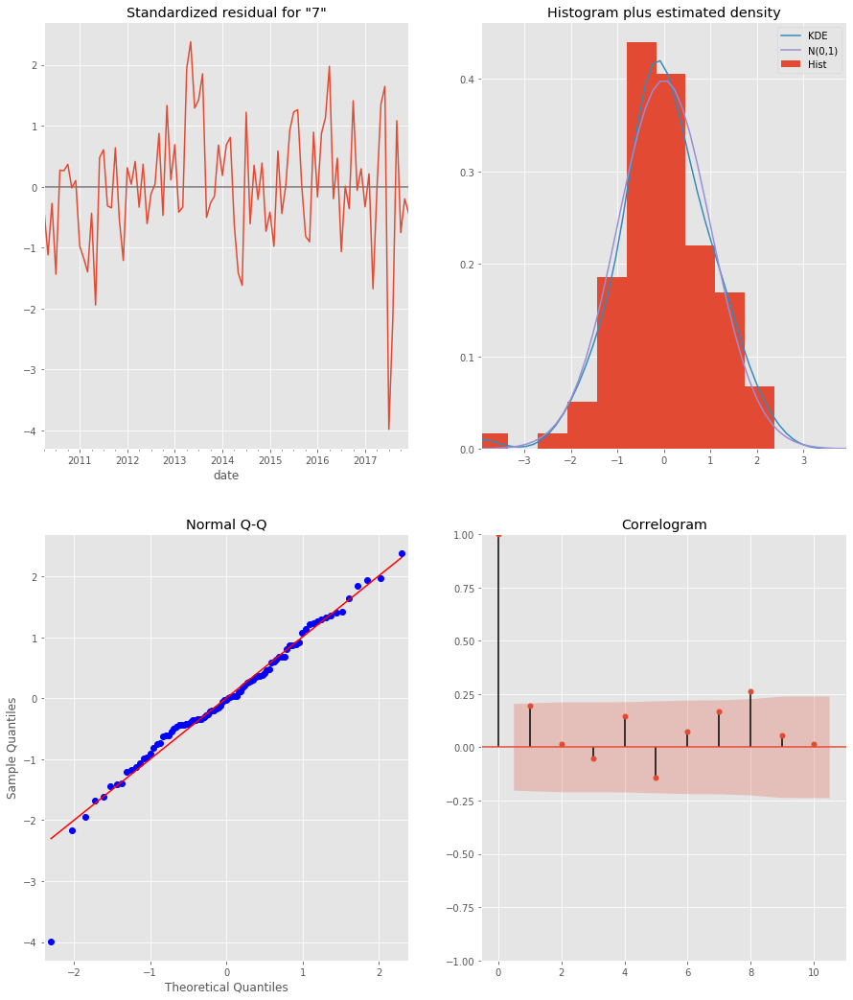

In [146]:
output = arima_fit(austin_78746_2010_log, order = (1,0,2), seasonal_order = (0,0,0,12))

In [224]:
def two_year_future_forecast(ts, output, log = None, plot = None):
    # Get forecast 24 steps ahead in future
    prediction_future = output.get_forecast(steps=24)

    # Get confidence intervals of forecasts
    pred_conf = prediction_future.conf_int()
    
    if plot == 'yes':

        # Plot future predictions with confidence intervals
        ax = ts['2010':].plot(label='observed', figsize=(20, 15))
        prediction_future.predicted_mean.plot(ax=ax, label='Forecast')
        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color='k', alpha=0.25)
        ax.set_xlabel('Date')
        ax.set_ylabel('Avg. Median Sale Price')

        plt.legend()
        plt.show()
    
    returns_df = pd.DataFrame(columns = ['Zipcode', 'two_year_returns_(%)'])
    
    if log == 'yes':
        pred_future_unlogged = np.exp(prediction_future.predicted_mean)
        predictions_year_groups = pred_future_unlogged.groupby(pd.Grouper(freq = 'A'))
        
        observed_year_groups = np.exp(ts).groupby(pd.Grouper(freq = 'A'))
        two_year_return = ((predictions_year_groups.mean()['2019'].values - observed_year_groups.mean()['2017'].values)/observed_year_groups.mean()['2017'].values)*100
        
        ts_df = pd.DataFrame(ts)
        for col in ts_df.columns:
            new_row = {'Zipcode':col, 'two_year_returns_(%)': two_year_return}
            returns_df.loc[len(returns_df.index)] = new_row
            returns_df['two_year_returns_(%)'] = round(returns_df['two_year_returns_(%)'].astype('int64'), 2)
        
        #return returns_df
    
    else:
        pred_future_unlogged = prediction_future.predicted_mean
        predictions_year_groups = pred_future_unlogged.groupby(pd.Grouper(freq = 'A'))
        
        observed_year_groups = ts.groupby(pd.Grouper(freq = 'A'))
        two_year_return = ((predictions_year_groups.mean()['2019'].values - observed_year_groups.mean()['2017'].values)/observed_year_groups.mean()['2017'].values)*100
        
        
        ts_df = pd.DataFrame(ts)
        for col in ts_df.columns:
            new_row = {'Zipcode':col, 'two_year_returns_(%)': two_year_return}
            returns_df.loc[len(returns_df.index)] = new_row
        
        #return returns_df
    return prediction_future

## Modeling across all of the Austin Zipcodes

In [274]:
#creating an empty dataframe to store all of our zipcodes and associated returns
returns_df = pd.DataFrame(columns = ['Zipcode', 'two_year_returns_(%)', 'r2', 'explained_var', 'rmse'])

for col in austin_zip.columns:
    #create a logged series for each austin zip code from 2010 - 2017 (only full years)
    ts_log_2010 = np.log(austin_zip[col]['2010':'2017'])
    ts_log_2010 = ts_log_2010.resample('MS').mean()
    
    #fitting the model
    output = arima_fit(ts_log_2010, order = (1,0,2), seasonal_order = (0,0,0,12))
    
    #using the dynamic predictions function to produce predicted and forecasted results
    pred, austin_forecasted, austin_truth = dynamic_predictions(output, ts_log_2010)

    #using the two_year_future_forecast function to find the two year future predictions
    pred_future = two_year_future_forecast(ts_log_2010, output, log = 'yes')
    
    #unlogging predictions to see them in real monetary value, grouping by year to find yearly improvement
    pred_future_unlogged = np.exp(pred_future.predicted_mean)
    predictions_year_groups = pred_future_unlogged.groupby(pd.Grouper(freq = 'A'))
    
    #same as above but with observed values
    observed_year_groups = np.exp(ts_log_2010).groupby(pd.Grouper(freq = 'A'))
    
    #calculating % return from observed 2017 price to 2019 price
    two_year_return = ((predictions_year_groups.mean()['2019'].values - observed_year_groups.mean()['2017'].values)/observed_year_groups.mean()['2017'].values)*100
    
    #reporting metrics
    explained_var, mae, rmse, r2 = report_metrics(austin_truth, austin_forecasted)
    
    #fill in zipcode and return data into dataframe    
    ts_df = pd.DataFrame(ts_log_2010)
    for col in ts_df.columns:
        new_row = {'Zipcode':col, 'two_year_returns_(%)': two_year_return, 'r2':r2, 'explained_var':explained_var, 'rmse':rmse}
        returns_df.loc[len(returns_df.index)] = new_row
        returns_df['two_year_returns_(%)'] = round(returns_df['two_year_returns_(%)'].astype('int64'), 2)

returns_df.head()

,Zipcode,two_year_returns_(%),r2,explained_var,rmse
0,78617,24,0.659254,0.867296,1.035961
1,78702,28,0.149472,0.370720,1.036816
2,78703,16,0.868692,0.955030,1.017449
3,78704,16,0.960397,0.978925,1.008609
4,78705,3,-0.802685,-0.675804,1.035823


Note that r2, explained variance, and rmse are based on the modeling of test data and is not measuring the quality of the 2-year forecast.

In [275]:
#dropping zipcodes where the model produced a negative R^2 value
zip_list = ['78705', '78730', '78731', '78735', '78751', '78752', '78759']
returns_df.drop(returns_df.loc[returns_df['Zipcode'].isin(zip_list)].index, inplace = True)

In [283]:
returns_df.sort_values(by = 'two_year_returns_(%)', ascending = False).head(10)

,Zipcode,two_year_returns_(%),r2,explained_var,rmse
23,78744,41,0.950731,0.965794,1.016527
6,78721,40,0.574075,0.905937,1.055582
32,78753,35,0.710833,0.919867,1.042395
22,78741,32,0.510580,0.620442,1.041058
9,78724,32,0.249127,0.770025,1.063418
36,78758,31,0.335847,0.767313,1.068786
8,78723,30,0.812586,0.813228,1.021536
10,78725,29,0.547158,0.599704,1.031258
1,78702,28,0.149472,0.370720,1.036816
12,78727,24,0.682508,0.879033,1.041453


In [ ]:
#what zipcodes am I the most wrong on and which am I the most right?
#look at top 3 explained variance vs. bottom 3
#compare forecasts for test set vs. forecasts for 2018 and 2019 (unseen data)
#test returns vs. future returns in dataframe

## Running PDQ grid search on top 5 Zip codes to see if I can find better parameters

In [284]:
austin_78744_2010_log = np.log(austin_zip['78744']['2010': '2017'].resample('MS').mean())
austin_78721_2010_log = np.log(austin_zip['78721']['2010': '2017'].resample('MS').mean())
austin_78753_2010_log = np.log(austin_zip['78753']['2010': '2017'].resample('MS').mean())
austin_78741_2010_log = np.log(austin_zip['78741']['2010': '2017'].resample('MS').mean())
austin_78724_2010_log = np.log(austin_zip['78724']['2010': '2017'].resample('MS').mean())

In [393]:
#creating a separate variable for each series' pdq test so we can access easier for our functions
pdq_78744 = pdq_test(austin_78744_2010_log)

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =604.2338371976397
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =495.99646284215623
ARIMA (0, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1360.5564721437536
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =-249.35700238930693
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =-265.6072015833132
ARIMA (0, 0, 0) x (0, 1, 2, 12)12 : AIC Calculated =1896.6112589862826
ARIMA (0, 0, 0) x (0, 2, 0, 12)12 : AIC Calculated =-188.40492082529332
ARIMA (0, 0, 0) x (0, 2, 1, 12)12 : AIC Calculated =-184.74163369588658
ARIMA (0, 0, 0) x (0, 2, 2, 12)12 : AIC Calculated =-176.71533941501588
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =-300.2177812571052
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =-300.2293472720576
ARIMA (0, 0, 0) x (1, 0, 2, 12)12 : AIC Calculated =1202.9456011154398
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =-259.2138602757501
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =-250.1089416337677
ARI

ARIMA (0, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-290.65958010482075
ARIMA (0, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-631.4176525660705
ARIMA (0, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-611.475058079266
ARIMA (0, 1, 1) x (1, 0, 2, 12)12 : AIC Calculated =3191.558444355637
ARIMA (0, 1, 1) x (1, 1, 0, 12)12 : AIC Calculated =-535.0447488493601
ARIMA (0, 1, 1) x (1, 1, 1, 12)12 : AIC Calculated =-517.1544419540685
ARIMA (0, 1, 1) x (1, 1, 2, 12)12 : AIC Calculated =2337.3017614611745
ARIMA (0, 1, 1) x (1, 2, 0, 12)12 : AIC Calculated =-410.16708950670966
ARIMA (0, 1, 1) x (1, 2, 1, 12)12 : AIC Calculated =-404.41532872913575
ARIMA (0, 1, 1) x (1, 2, 2, 12)12 : AIC Calculated =-288.6937112267078
ARIMA (0, 1, 1) x (2, 0, 0, 12)12 : AIC Calculated =-544.1119832952219
ARIMA (0, 1, 1) x (2, 0, 1, 12)12 : AIC Calculated =-530.3629622821768
ARIMA (0, 1, 1) x (2, 0, 2, 12)12 : AIC Calculated =3177.367433408104
ARIMA (0, 1, 1) x (2, 1, 0, 12)12 : AIC Calculated =-454.81662422321085
ARIMA

ARIMA (0, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-355.82178812177693
ARIMA (0, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-265.4783528779325
ARIMA (0, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-471.360123576265
ARIMA (0, 2, 2) x (2, 0, 1, 12)12 : AIC Calculated =-467.4321681079457
ARIMA (0, 2, 2) x (2, 0, 2, 12)12 : AIC Calculated =2763.9972064853655
ARIMA (0, 2, 2) x (2, 1, 0, 12)12 : AIC Calculated =-434.860486026528
ARIMA (0, 2, 2) x (2, 1, 1, 12)12 : AIC Calculated =-432.71223229299494
ARIMA (0, 2, 2) x (2, 1, 2, 12)12 : AIC Calculated =2410.361270796876
ARIMA (0, 2, 2) x (2, 2, 0, 12)12 : AIC Calculated =-299.0193739140108
ARIMA (0, 2, 2) x (2, 2, 1, 12)12 : AIC Calculated =-303.71808092189315
ARIMA (0, 2, 2) x (2, 2, 2, 12)12 : AIC Calculated =-263.7977794095115
ARIMA (1, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =-670.1166935838282
ARIMA (1, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =-581.3660839126877
ARIMA (1, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1848.7878554995195
ARIMA 

ARIMA (1, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-292.91595840114366
ARIMA (1, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-291.1066594686549
ARIMA (1, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-273.5328288644427
ARIMA (1, 1, 1) x (0, 0, 0, 12)12 : AIC Calculated =-754.7770434267615
ARIMA (1, 1, 1) x (0, 0, 1, 12)12 : AIC Calculated =-657.7041027689583
ARIMA (1, 1, 1) x (0, 0, 2, 12)12 : AIC Calculated =3202.8141147994097
ARIMA (1, 1, 1) x (0, 1, 0, 12)12 : AIC Calculated =-601.1406003244858
ARIMA (1, 1, 1) x (0, 1, 1, 12)12 : AIC Calculated =-529.8749035389126
ARIMA (1, 1, 1) x (0, 1, 2, 12)12 : AIC Calculated =2194.1926519073513
ARIMA (1, 1, 1) x (0, 2, 0, 12)12 : AIC Calculated =-445.19084327345024
ARIMA (1, 1, 1) x (0, 2, 1, 12)12 : AIC Calculated =-391.0045437683792
ARIMA (1, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-292.24321412907386
ARIMA (1, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-641.8082543473258
ARIMA (1, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-634.3488938818033
ARI

ARIMA (1, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2597.690259557312
ARIMA (1, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-419.9160279452598
ARIMA (1, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-364.43536530185844
ARIMA (1, 2, 2) x (0, 2, 2, 12)12 : AIC Calculated =-270.36892021451024
ARIMA (1, 2, 2) x (1, 0, 0, 12)12 : AIC Calculated =-641.6909647362027
ARIMA (1, 2, 2) x (1, 0, 1, 12)12 : AIC Calculated =-623.678392871212
ARIMA (1, 2, 2) x (1, 0, 2, 12)12 : AIC Calculated =2679.7359961998063
ARIMA (1, 2, 2) x (1, 1, 0, 12)12 : AIC Calculated =-512.4561375453931
ARIMA (1, 2, 2) x (1, 1, 1, 12)12 : AIC Calculated =-498.4744343707772
ARIMA (1, 2, 2) x (1, 1, 2, 12)12 : AIC Calculated =2634.5595873370753
ARIMA (1, 2, 2) x (1, 2, 0, 12)12 : AIC Calculated =-375.91503102876663
ARIMA (1, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-358.77696888609336
ARIMA (1, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-268.3387172773183
ARIMA (1, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-550.5733890813344
ARIM

ARIMA (2, 1, 0) x (1, 1, 2, 12)12 : AIC Calculated =2779.504300463071
ARIMA (2, 1, 0) x (1, 2, 0, 12)12 : AIC Calculated =-378.10974025667934
ARIMA (2, 1, 0) x (1, 2, 1, 12)12 : AIC Calculated =-379.0177660157026
ARIMA (2, 1, 0) x (1, 2, 2, 12)12 : AIC Calculated =-284.26538838003825
ARIMA (2, 1, 0) x (2, 0, 0, 12)12 : AIC Calculated =-528.4516847596273
ARIMA (2, 1, 0) x (2, 0, 1, 12)12 : AIC Calculated =-516.9336341605762
ARIMA (2, 1, 0) x (2, 0, 2, 12)12 : AIC Calculated =2746.177153474276
ARIMA (2, 1, 0) x (2, 1, 0, 12)12 : AIC Calculated =-424.08490633249124
ARIMA (2, 1, 0) x (2, 1, 1, 12)12 : AIC Calculated =-424.51388757586324
ARIMA (2, 1, 0) x (2, 1, 2, 12)12 : AIC Calculated =2755.2307316512147
ARIMA (2, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-295.21943813322815
ARIMA (2, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-303.2543929701585
ARIMA (2, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-275.0172273359673
ARIMA (2, 1, 1) x (0, 0, 0, 12)12 : AIC Calculated =-733.6858417097577
ARI

ARIMA (2, 2, 1) x (2, 1, 1, 12)12 : AIC Calculated =-420.67854485194084
ARIMA (2, 2, 1) x (2, 1, 2, 12)12 : AIC Calculated =2266.54227626982
ARIMA (2, 2, 1) x (2, 2, 0, 12)12 : AIC Calculated =-292.6327966297751
ARIMA (2, 2, 1) x (2, 2, 1, 12)12 : AIC Calculated =-294.66118644863735
ARIMA (2, 2, 1) x (2, 2, 2, 12)12 : AIC Calculated =-272.9274295570174
ARIMA (2, 2, 2) x (0, 0, 0, 12)12 : AIC Calculated =-728.1785290536519
ARIMA (2, 2, 2) x (0, 0, 1, 12)12 : AIC Calculated =-641.912473032485
ARIMA (2, 2, 2) x (0, 0, 2, 12)12 : AIC Calculated =3062.7271955823685
ARIMA (2, 2, 2) x (0, 1, 0, 12)12 : AIC Calculated =-577.3246197689195
ARIMA (2, 2, 2) x (0, 1, 1, 12)12 : AIC Calculated =-511.96865578640325
ARIMA (2, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2244.4475934419575
ARIMA (2, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-423.96626869146496
ARIMA (2, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-383.9650337217475
ARIMA (2, 2, 2) x (0, 2, 2, 12)12 : AIC Calculated =-272.9865424747929
ARIMA

In [394]:
pdq_78721 = pdq_test(austin_78721_2010_log)

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =607.4529258156165
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =497.7261437064139
ARIMA (0, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1554.52788209851
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =-254.70757531326922
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =-203.05384305218737
ARIMA (0, 0, 0) x (0, 1, 2, 12)12 : AIC Calculated =2274.757579719286
ARIMA (0, 0, 0) x (0, 2, 0, 12)12 : AIC Calculated =-146.30769252353767
ARIMA (0, 0, 0) x (0, 2, 1, 12)12 : AIC Calculated =-139.80534553160444
ARIMA (0, 0, 0) x (0, 2, 2, 12)12 : AIC Calculated =-115.19307155116677
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =-258.4792583865948
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =-251.00321759749238
ARIMA (0, 0, 0) x (1, 0, 2, 12)12 : AIC Calculated =1814.2421797187471
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =-213.68079253231886
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =-206.0074794255719
ARIM

ARIMA (0, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-310.18510526145184
ARIMA (0, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-618.1660651809243
ARIMA (0, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-596.5650096057423
ARIMA (0, 1, 1) x (1, 0, 2, 12)12 : AIC Calculated =3427.3351055315816
ARIMA (0, 1, 1) x (1, 1, 0, 12)12 : AIC Calculated =-511.1731706604287
ARIMA (0, 1, 1) x (1, 1, 1, 12)12 : AIC Calculated =-468.6913989091162
ARIMA (0, 1, 1) x (1, 1, 2, 12)12 : AIC Calculated =2232.9224672977048
ARIMA (0, 1, 1) x (1, 2, 0, 12)12 : AIC Calculated =-371.1948092053938
ARIMA (0, 1, 1) x (1, 2, 1, 12)12 : AIC Calculated =-329.9032536797076
ARIMA (0, 1, 1) x (1, 2, 2, 12)12 : AIC Calculated =-263.8350128785754
ARIMA (0, 1, 1) x (2, 0, 0, 12)12 : AIC Calculated =-520.2681739965493
ARIMA (0, 1, 1) x (2, 0, 1, 12)12 : AIC Calculated =-509.3060940832827
ARIMA (0, 1, 1) x (2, 0, 2, 12)12 : AIC Calculated =3369.53692185915
ARIMA (0, 1, 1) x (2, 1, 0, 12)12 : AIC Calculated =-433.56360774965805
ARIMA 

ARIMA (0, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-359.6783137853512
ARIMA (0, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-255.45125418076395
ARIMA (0, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-559.1167784692306
ARIMA (0, 2, 2) x (2, 0, 1, 12)12 : AIC Calculated =-548.6536392595883
ARIMA (0, 2, 2) x (2, 0, 2, 12)12 : AIC Calculated =2652.348852442408
ARIMA (0, 2, 2) x (2, 1, 0, 12)12 : AIC Calculated =-434.058634172772
ARIMA (0, 2, 2) x (2, 1, 1, 12)12 : AIC Calculated =-433.5208350799431
ARIMA (0, 2, 2) x (2, 1, 2, 12)12 : AIC Calculated =2043.981801766105
ARIMA (0, 2, 2) x (2, 2, 0, 12)12 : AIC Calculated =-325.97556162644975
ARIMA (0, 2, 2) x (2, 2, 1, 12)12 : AIC Calculated =-316.03093762229474
ARIMA (0, 2, 2) x (2, 2, 2, 12)12 : AIC Calculated =-253.4512503719571
ARIMA (1, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =-668.0983023735389
ARIMA (1, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =-571.8215193318465
ARIMA (1, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1488.5424907136023
ARIMA 

ARIMA (1, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-322.7691307435405
ARIMA (1, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-304.7908020385392
ARIMA (1, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-271.3038260273556
ARIMA (1, 1, 1) x (0, 0, 0, 12)12 : AIC Calculated =-768.0219989582242
ARIMA (1, 1, 1) x (0, 0, 1, 12)12 : AIC Calculated =-625.6155856752126
ARIMA (1, 1, 1) x (0, 0, 2, 12)12 : AIC Calculated =2902.0242722039047
ARIMA (1, 1, 1) x (0, 1, 0, 12)12 : AIC Calculated =-594.1000561424946
ARIMA (1, 1, 1) x (0, 1, 1, 12)12 : AIC Calculated =-494.4186803905028
ARIMA (1, 1, 1) x (0, 1, 2, 12)12 : AIC Calculated =2496.3651626188125
ARIMA (1, 1, 1) x (0, 2, 0, 12)12 : AIC Calculated =-432.2382554243954
ARIMA (1, 1, 1) x (0, 2, 1, 12)12 : AIC Calculated =-334.5619999259335
ARIMA (1, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-275.14971600164836
ARIMA (1, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-633.0537024848118
ARIMA (1, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-619.6387299073268
ARIMA

ARIMA (1, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2052.2984437712175
ARIMA (1, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-410.096151343179
ARIMA (1, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-357.42414660560115
ARIMA (1, 2, 2) x (0, 2, 2, 12)12 : AIC Calculated =-254.59838940523537
ARIMA (1, 2, 2) x (1, 0, 0, 12)12 : AIC Calculated =-655.8639618179831
ARIMA (1, 2, 2) x (1, 0, 1, 12)12 : AIC Calculated =-629.9199930076795
ARIMA (1, 2, 2) x (1, 0, 2, 12)12 : AIC Calculated =2688.0842368363255
ARIMA (1, 2, 2) x (1, 1, 0, 12)12 : AIC Calculated =-509.8429268423696
ARIMA (1, 2, 2) x (1, 1, 1, 12)12 : AIC Calculated =-495.551570271596
ARIMA (1, 2, 2) x (1, 1, 2, 12)12 : AIC Calculated =2147.3583266360083
ARIMA (1, 2, 2) x (1, 2, 0, 12)12 : AIC Calculated =-371.03067465266076
ARIMA (1, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-357.35502589947
ARIMA (1, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-252.59838940523645
ARIMA (1, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-550.8186483738081
ARIMA 

ARIMA (2, 1, 0) x (1, 1, 1, 12)12 : AIC Calculated =-481.90176302162905
ARIMA (2, 1, 0) x (1, 1, 2, 12)12 : AIC Calculated =2738.2539402525617
ARIMA (2, 1, 0) x (1, 2, 0, 12)12 : AIC Calculated =-361.30650717995536
ARIMA (2, 1, 0) x (1, 2, 1, 12)12 : AIC Calculated =-353.707501001215
ARIMA (2, 1, 0) x (1, 2, 2, 12)12 : AIC Calculated =-273.78248126545384
ARIMA (2, 1, 0) x (2, 0, 0, 12)12 : AIC Calculated =-497.2462793963563
ARIMA (2, 1, 0) x (2, 0, 1, 12)12 : AIC Calculated =-480.3999807713435
ARIMA (2, 1, 0) x (2, 0, 2, 12)12 : AIC Calculated =2278.246712072517
ARIMA (2, 1, 0) x (2, 1, 0, 12)12 : AIC Calculated =-425.2550374706758
ARIMA (2, 1, 0) x (2, 1, 1, 12)12 : AIC Calculated =-404.8214554819453
ARIMA (2, 1, 0) x (2, 1, 2, 12)12 : AIC Calculated =2631.132192876421
ARIMA (2, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-320.0247845240523
ARIMA (2, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-303.0642708299422
ARIMA (2, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-265.07352621472455
ARIMA

ARIMA (2, 2, 1) x (2, 1, 0, 12)12 : AIC Calculated =-423.6210824099117
ARIMA (2, 2, 1) x (2, 1, 1, 12)12 : AIC Calculated =-419.24091209497124
ARIMA (2, 2, 1) x (2, 1, 2, 12)12 : AIC Calculated =2332.6153418414633
ARIMA (2, 2, 1) x (2, 2, 0, 12)12 : AIC Calculated =-304.55807148449577
ARIMA (2, 2, 1) x (2, 2, 1, 12)12 : AIC Calculated =-292.4237077282203
ARIMA (2, 2, 1) x (2, 2, 2, 12)12 : AIC Calculated =-252.68381545637055
ARIMA (2, 2, 2) x (0, 0, 0, 12)12 : AIC Calculated =-757.2497514647606
ARIMA (2, 2, 2) x (0, 0, 1, 12)12 : AIC Calculated =-645.092915025269
ARIMA (2, 2, 2) x (0, 0, 2, 12)12 : AIC Calculated =2876.3237218681716
ARIMA (2, 2, 2) x (0, 1, 0, 12)12 : AIC Calculated =-590.7338258680426
ARIMA (2, 2, 2) x (0, 1, 1, 12)12 : AIC Calculated =-518.2648772716406
ARIMA (2, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =1650.7998075139762
ARIMA (2, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-418.1258360124818
ARIMA (2, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-380.93875648706023
ARI

In [395]:
pdq_78753 = pdq_test(austin_78753_2010_log)

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =607.364968100323
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =497.89255189545435
ARIMA (0, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1959.4599403973616
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =-260.8734446753398
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =-260.8332644718418
ARIMA (0, 0, 0) x (0, 1, 2, 12)12 : AIC Calculated =2317.4942703976744
ARIMA (0, 0, 0) x (0, 2, 0, 12)12 : AIC Calculated =-202.02833869185764
ARIMA (0, 0, 0) x (0, 2, 1, 12)12 : AIC Calculated =-140.0681037350222
ARIMA (0, 0, 0) x (0, 2, 2, 12)12 : AIC Calculated =-173.93163864721083
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =-314.69159237085466
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =-314.08500604317345
ARIMA (0, 0, 0) x (1, 0, 2, 12)12 : AIC Calculated =2037.37921247309
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =-261.27924532062514
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =-247.57655704870373
ARIM

ARIMA (0, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-275.8663117232344
ARIMA (0, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-657.2224534172851
ARIMA (0, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-636.4680059409212
ARIMA (0, 1, 1) x (1, 0, 2, 12)12 : AIC Calculated =2911.5279687710818
ARIMA (0, 1, 1) x (1, 1, 0, 12)12 : AIC Calculated =-538.7152376983172
ARIMA (0, 1, 1) x (1, 1, 1, 12)12 : AIC Calculated =-518.7601901546573
ARIMA (0, 1, 1) x (1, 1, 2, 12)12 : AIC Calculated =1650.8037139662697
ARIMA (0, 1, 1) x (1, 2, 0, 12)12 : AIC Calculated =-406.1437271349757
ARIMA (0, 1, 1) x (1, 2, 1, 12)12 : AIC Calculated =-384.84965332658567
ARIMA (0, 1, 1) x (1, 2, 2, 12)12 : AIC Calculated =-273.86790541478604
ARIMA (0, 1, 1) x (2, 0, 0, 12)12 : AIC Calculated =-560.5403405877069
ARIMA (0, 1, 1) x (2, 0, 1, 12)12 : AIC Calculated =-551.7378307093322
ARIMA (0, 1, 1) x (2, 0, 2, 12)12 : AIC Calculated =2842.728023579962
ARIMA (0, 1, 1) x (2, 1, 0, 12)12 : AIC Calculated =-449.3138745972548
ARIMA

ARIMA (0, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-384.3653682043334
ARIMA (0, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-276.0580139732786
ARIMA (0, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-605.0298583798443
ARIMA (0, 2, 2) x (2, 0, 1, 12)12 : AIC Calculated =-600.6285385470688
ARIMA (0, 2, 2) x (2, 0, 2, 12)12 : AIC Calculated =2836.685130947371
ARIMA (0, 2, 2) x (2, 1, 0, 12)12 : AIC Calculated =-478.34153496126453
ARIMA (0, 2, 2) x (2, 1, 1, 12)12 : AIC Calculated =-467.13009118372054
ARIMA (0, 2, 2) x (2, 1, 2, 12)12 : AIC Calculated =16.0
ARIMA (0, 2, 2) x (2, 2, 0, 12)12 : AIC Calculated =-341.29993064890175
ARIMA (0, 2, 2) x (2, 2, 1, 12)12 : AIC Calculated =-340.1004406713986
ARIMA (0, 2, 2) x (2, 2, 2, 12)12 : AIC Calculated =-274.05798100821863
ARIMA (1, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =-700.0512819489525
ARIMA (1, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =-355.13235852616157
ARIMA (1, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =2552.3362563901333
ARIMA (1, 0, 0) 

ARIMA (1, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-339.02345237754975
ARIMA (1, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-323.5498509319552
ARIMA (1, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-280.325794018513
ARIMA (1, 1, 1) x (0, 0, 0, 12)12 : AIC Calculated =-827.8714956608044
ARIMA (1, 1, 1) x (0, 0, 1, 12)12 : AIC Calculated =-651.9031820967863
ARIMA (1, 1, 1) x (0, 0, 2, 12)12 : AIC Calculated =3344.310062072273
ARIMA (1, 1, 1) x (0, 1, 0, 12)12 : AIC Calculated =-643.672341623851
ARIMA (1, 1, 1) x (0, 1, 1, 12)12 : AIC Calculated =-556.8814795787634
ARIMA (1, 1, 1) x (0, 1, 2, 12)12 : AIC Calculated =2467.383661320109
ARIMA (1, 1, 1) x (0, 2, 0, 12)12 : AIC Calculated =-471.5287970875672
ARIMA (1, 1, 1) x (0, 2, 1, 12)12 : AIC Calculated =-400.9888446993937
ARIMA (1, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-297.79823984299776
ARIMA (1, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-686.3544392920326
ARIMA (1, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-678.4656735465354
ARIMA (1

ARIMA (1, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2490.1996610038345
ARIMA (1, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-458.08170368973435
ARIMA (1, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-362.68873597073116
ARIMA (1, 2, 2) x (0, 2, 2, 12)12 : AIC Calculated =-281.3367187256229
ARIMA (1, 2, 2) x (1, 0, 0, 12)12 : AIC Calculated =-707.2922258909582
ARIMA (1, 2, 2) x (1, 0, 1, 12)12 : AIC Calculated =-686.5140558257624
ARIMA (1, 2, 2) x (1, 0, 2, 12)12 : AIC Calculated =3191.284450525109
ARIMA (1, 2, 2) x (1, 1, 0, 12)12 : AIC Calculated =-563.6529079589924
ARIMA (1, 2, 2) x (1, 1, 1, 12)12 : AIC Calculated =-544.3791706291744
ARIMA (1, 2, 2) x (1, 1, 2, 12)12 : AIC Calculated =2142.600026327876
ARIMA (1, 2, 2) x (1, 2, 0, 12)12 : AIC Calculated =-411.2670203507257
ARIMA (1, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-392.7596880052006
ARIMA (1, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-279.3367187256244
ARIMA (1, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-594.0699213990616
ARIMA 

ARIMA (2, 1, 0) x (1, 1, 1, 12)12 : AIC Calculated =-575.3420006711839
ARIMA (2, 1, 0) x (1, 1, 2, 12)12 : AIC Calculated =2534.6098584874135
ARIMA (2, 1, 0) x (1, 2, 0, 12)12 : AIC Calculated =-429.8195326182074
ARIMA (2, 1, 0) x (1, 2, 1, 12)12 : AIC Calculated =-426.2832525204402
ARIMA (2, 1, 0) x (1, 2, 2, 12)12 : AIC Calculated =-325.2417286468446
ARIMA (2, 1, 0) x (2, 0, 0, 12)12 : AIC Calculated =-583.7423348425604
ARIMA (2, 1, 0) x (2, 0, 1, 12)12 : AIC Calculated =-571.9894332005015
ARIMA (2, 1, 0) x (2, 0, 2, 12)12 : AIC Calculated =3219.094303449748
ARIMA (2, 1, 0) x (2, 1, 0, 12)12 : AIC Calculated =-478.41813576801786
ARIMA (2, 1, 0) x (2, 1, 1, 12)12 : AIC Calculated =-475.3725907204743
ARIMA (2, 1, 0) x (2, 1, 2, 12)12 : AIC Calculated =2549.243827076587
ARIMA (2, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-354.3827872202001
ARIMA (2, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-326.25049076672974
ARIMA (2, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-317.9370364958537
ARIMA 

ARIMA (2, 2, 1) x (2, 1, 0, 12)12 : AIC Calculated =-467.4478872075202
ARIMA (2, 2, 1) x (2, 1, 1, 12)12 : AIC Calculated =-464.7158062164503
ARIMA (2, 2, 1) x (2, 1, 2, 12)12 : AIC Calculated =2163.562423551294
ARIMA (2, 2, 1) x (2, 2, 0, 12)12 : AIC Calculated =-327.3866185548985
ARIMA (2, 2, 1) x (2, 2, 1, 12)12 : AIC Calculated =-324.9044686410796
ARIMA (2, 2, 1) x (2, 2, 2, 12)12 : AIC Calculated =-310.70352831208004
ARIMA (2, 2, 2) x (0, 0, 0, 12)12 : AIC Calculated =-812.0033916362592
ARIMA (2, 2, 2) x (0, 0, 1, 12)12 : AIC Calculated =-699.8599774239136
ARIMA (2, 2, 2) x (0, 0, 2, 12)12 : AIC Calculated =3195.6248487441267
ARIMA (2, 2, 2) x (0, 1, 0, 12)12 : AIC Calculated =-638.887175071393
ARIMA (2, 2, 2) x (0, 1, 1, 12)12 : AIC Calculated =-532.8114423367525
ARIMA (2, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2911.131249503909
ARIMA (2, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-478.69923640064974
ARIMA (2, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-418.60120473147526
ARIMA 

In [396]:
pdq_78741 = pdq_test(austin_78741_2010_log)

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =607.6731646071837
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =497.99229053272205
ARIMA (0, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =751.3602731806554
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =-278.55063287318563
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =-236.25132471292162
ARIMA (0, 0, 0) x (0, 1, 2, 12)12 : AIC Calculated =2283.009648014667
ARIMA (0, 0, 0) x (0, 2, 0, 12)12 : AIC Calculated =-200.31440969863203
ARIMA (0, 0, 0) x (0, 2, 1, 12)12 : AIC Calculated =-159.14168232345924
ARIMA (0, 0, 0) x (0, 2, 2, 12)12 : AIC Calculated =-112.46280556516284
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =-289.9607368687051
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =-298.3407727145108
ARIMA (0, 0, 0) x (1, 0, 2, 12)12 : AIC Calculated =885.8203681803203
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =-208.7314470877959
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =-231.7969723230785
ARIMA

ARIMA (0, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-294.1535260982817
ARIMA (0, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-642.1755562069898
ARIMA (0, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-626.2152922649335
ARIMA (0, 1, 1) x (1, 0, 2, 12)12 : AIC Calculated =2597.111367995366
ARIMA (0, 1, 1) x (1, 1, 0, 12)12 : AIC Calculated =-525.4761006904357
ARIMA (0, 1, 1) x (1, 1, 1, 12)12 : AIC Calculated =-508.8452408871044
ARIMA (0, 1, 1) x (1, 1, 2, 12)12 : AIC Calculated =2120.361451110148
ARIMA (0, 1, 1) x (1, 2, 0, 12)12 : AIC Calculated =-394.81943949551743
ARIMA (0, 1, 1) x (1, 2, 1, 12)12 : AIC Calculated =-395.3660435469584
ARIMA (0, 1, 1) x (1, 2, 2, 12)12 : AIC Calculated =-279.6582624326987
ARIMA (0, 1, 1) x (2, 0, 0, 12)12 : AIC Calculated =-536.3224447512325
ARIMA (0, 1, 1) x (2, 0, 1, 12)12 : AIC Calculated =-536.514206926866
ARIMA (0, 1, 1) x (2, 0, 2, 12)12 : AIC Calculated =2743.5308711331695
ARIMA (0, 1, 1) x (2, 1, 0, 12)12 : AIC Calculated =-438.4230698051586
ARIMA (0

ARIMA (0, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-385.8873162084136
ARIMA (0, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-267.4833246299767
ARIMA (0, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-580.1077778460228
ARIMA (0, 2, 2) x (2, 0, 1, 12)12 : AIC Calculated =-577.7388112966544
ARIMA (0, 2, 2) x (2, 0, 2, 12)12 : AIC Calculated =2546.9578751945905
ARIMA (0, 2, 2) x (2, 1, 0, 12)12 : AIC Calculated =-449.93972571658156
ARIMA (0, 2, 2) x (2, 1, 1, 12)12 : AIC Calculated =-450.34438568498405
ARIMA (0, 2, 2) x (2, 1, 2, 12)12 : AIC Calculated =2409.2110453224122
ARIMA (0, 2, 2) x (2, 2, 0, 12)12 : AIC Calculated =-316.6705376290302
ARIMA (0, 2, 2) x (2, 2, 1, 12)12 : AIC Calculated =-325.0671646591245
ARIMA (0, 2, 2) x (2, 2, 2, 12)12 : AIC Calculated =-265.4289844511906
ARIMA (1, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =-696.0789791179272
ARIMA (1, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =-595.6549538333702
ARIMA (1, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1672.752042956381
ARIMA

ARIMA (1, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-309.1368189021451
ARIMA (1, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-310.1191981116487
ARIMA (1, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-278.55324046405957
ARIMA (1, 1, 1) x (0, 0, 0, 12)12 : AIC Calculated =-800.1524015461122
ARIMA (1, 1, 1) x (0, 0, 1, 12)12 : AIC Calculated =-663.2592165870651
ARIMA (1, 1, 1) x (0, 0, 2, 12)12 : AIC Calculated =3085.151165089479
ARIMA (1, 1, 1) x (0, 1, 0, 12)12 : AIC Calculated =-628.6987516301792
ARIMA (1, 1, 1) x (0, 1, 1, 12)12 : AIC Calculated =-549.4935603166981
ARIMA (1, 1, 1) x (0, 1, 2, 12)12 : AIC Calculated =2905.4410322003127
ARIMA (1, 1, 1) x (0, 2, 0, 12)12 : AIC Calculated =-469.0637034862776
ARIMA (1, 1, 1) x (0, 2, 1, 12)12 : AIC Calculated =-402.6143927837765
ARIMA (1, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-292.9098288127293
ARIMA (1, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-664.1835879912435
ARIMA (1, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-653.3056546833875
ARIMA 

ARIMA (1, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2520.159541043597
ARIMA (1, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-444.1196716883435
ARIMA (1, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-359.6974375011151
ARIMA (1, 2, 2) x (0, 2, 2, 12)12 : AIC Calculated =-270.95370389683706
ARIMA (1, 2, 2) x (1, 0, 0, 12)12 : AIC Calculated =-674.7002061084826
ARIMA (1, 2, 2) x (1, 0, 1, 12)12 : AIC Calculated =-659.0720572310996
ARIMA (1, 2, 2) x (1, 0, 2, 12)12 : AIC Calculated =2679.2166889718137
ARIMA (1, 2, 2) x (1, 1, 0, 12)12 : AIC Calculated =-528.2745249097508
ARIMA (1, 2, 2) x (1, 1, 1, 12)12 : AIC Calculated =-509.2660913100409
ARIMA (1, 2, 2) x (1, 1, 2, 12)12 : AIC Calculated =2546.991270780987
ARIMA (1, 2, 2) x (1, 2, 0, 12)12 : AIC Calculated =-386.8390183897464
ARIMA (1, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-370.33976225886244
ARIMA (1, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-268.8829210010874
ARIMA (1, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-584.3771573569215
ARIMA 

ARIMA (2, 1, 0) x (1, 1, 1, 12)12 : AIC Calculated =-529.0168007163779
ARIMA (2, 1, 0) x (1, 1, 2, 12)12 : AIC Calculated =2684.3614364671575
ARIMA (2, 1, 0) x (1, 2, 0, 12)12 : AIC Calculated =-392.6583535863504
ARIMA (2, 1, 0) x (1, 2, 1, 12)12 : AIC Calculated =-406.64149252370044
ARIMA (2, 1, 0) x (1, 2, 2, 12)12 : AIC Calculated =-295.9141792978172
ARIMA (2, 1, 0) x (2, 0, 0, 12)12 : AIC Calculated =-529.269591010597
ARIMA (2, 1, 0) x (2, 0, 1, 12)12 : AIC Calculated =-530.6710884374307
ARIMA (2, 1, 0) x (2, 0, 2, 12)12 : AIC Calculated =3058.0187212351084
ARIMA (2, 1, 0) x (2, 1, 0, 12)12 : AIC Calculated =-443.60733386587316
ARIMA (2, 1, 0) x (2, 1, 1, 12)12 : AIC Calculated =-436.1994757892725
ARIMA (2, 1, 0) x (2, 1, 2, 12)12 : AIC Calculated =2524.7309627207096
ARIMA (2, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-309.761603678624
ARIMA (2, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-304.98144024724365
ARIMA (2, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-286.0846003173459
ARIMA

ARIMA (2, 2, 1) x (2, 1, 0, 12)12 : AIC Calculated =-442.2765173996542
ARIMA (2, 2, 1) x (2, 1, 1, 12)12 : AIC Calculated =-441.44207054238063
ARIMA (2, 2, 1) x (2, 1, 2, 12)12 : AIC Calculated =2679.5888690479073
ARIMA (2, 2, 1) x (2, 2, 0, 12)12 : AIC Calculated =-307.5235407534308
ARIMA (2, 2, 1) x (2, 2, 1, 12)12 : AIC Calculated =-322.0058214511268
ARIMA (2, 2, 1) x (2, 2, 2, 12)12 : AIC Calculated =-277.23355263425395
ARIMA (2, 2, 2) x (0, 0, 0, 12)12 : AIC Calculated =-773.202755165663
ARIMA (2, 2, 2) x (0, 0, 1, 12)12 : AIC Calculated =-667.0933452067069
ARIMA (2, 2, 2) x (0, 0, 2, 12)12 : AIC Calculated =1479.58140551176
ARIMA (2, 2, 2) x (0, 1, 0, 12)12 : AIC Calculated =-601.5927249794248
ARIMA (2, 2, 2) x (0, 1, 1, 12)12 : AIC Calculated =-512.9113242747037
ARIMA (2, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2455.515399481888
ARIMA (2, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-444.2968640214549
ARIMA (2, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-361.0832537935663
ARIMA (2

In [397]:
pdq_78724 = pdq_test(austin_78724_2010_log)

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =605.2924648374109
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =495.9873609970264
ARIMA (0, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =1418.991568323317
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =-222.7763790849294
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =-195.36093771985637
ARIMA (0, 0, 0) x (0, 1, 2, 12)12 : AIC Calculated =1749.5309440520539
ARIMA (0, 0, 0) x (0, 2, 0, 12)12 : AIC Calculated =-167.6980483422385
ARIMA (0, 0, 0) x (0, 2, 1, 12)12 : AIC Calculated =-127.7589388814628
ARIMA (0, 0, 0) x (0, 2, 2, 12)12 : AIC Calculated =-100.04365130538145
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =-270.0760054765067
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =-274.8996566555721
ARIMA (0, 0, 0) x (1, 0, 2, 12)12 : AIC Calculated =1057.7102454206868
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =-201.00310443990705
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =-190.9799401449037
ARIMA 

ARIMA (0, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-300.6899925637693
ARIMA (0, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-627.1712067686502
ARIMA (0, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-633.2272234944973
ARIMA (0, 1, 1) x (1, 0, 2, 12)12 : AIC Calculated =1770.1390393404135
ARIMA (0, 1, 1) x (1, 1, 0, 12)12 : AIC Calculated =-495.6067265414
ARIMA (0, 1, 1) x (1, 1, 1, 12)12 : AIC Calculated =-476.29171409101406
ARIMA (0, 1, 1) x (1, 1, 2, 12)12 : AIC Calculated =2909.603520330384
ARIMA (0, 1, 1) x (1, 2, 0, 12)12 : AIC Calculated =-361.2199194064221
ARIMA (0, 1, 1) x (1, 2, 1, 12)12 : AIC Calculated =-345.23868048677843
ARIMA (0, 1, 1) x (1, 2, 2, 12)12 : AIC Calculated =-300.4019694192562
ARIMA (0, 1, 1) x (2, 0, 0, 12)12 : AIC Calculated =-528.06780639836
ARIMA (0, 1, 1) x (2, 0, 1, 12)12 : AIC Calculated =-522.4848322105981
ARIMA (0, 1, 1) x (2, 0, 2, 12)12 : AIC Calculated =2812.9586983473987
ARIMA (0, 1, 1) x (2, 1, 0, 12)12 : AIC Calculated =-417.7493439881065
ARIMA (0, 

ARIMA (0, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-346.37671015648385
ARIMA (0, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-244.27174433001034
ARIMA (0, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-569.4626313591889
ARIMA (0, 2, 2) x (2, 0, 1, 12)12 : AIC Calculated =-563.992692641458
ARIMA (0, 2, 2) x (2, 0, 2, 12)12 : AIC Calculated =2745.289903227619
ARIMA (0, 2, 2) x (2, 1, 0, 12)12 : AIC Calculated =-446.44110155038805
ARIMA (0, 2, 2) x (2, 1, 1, 12)12 : AIC Calculated =-436.10143693853524
ARIMA (0, 2, 2) x (2, 1, 2, 12)12 : AIC Calculated =2375.107130142332
ARIMA (0, 2, 2) x (2, 2, 0, 12)12 : AIC Calculated =-318.35821714643754
ARIMA (0, 2, 2) x (2, 2, 1, 12)12 : AIC Calculated =-305.16166543153855
ARIMA (0, 2, 2) x (2, 2, 2, 12)12 : AIC Calculated =-242.2717494341744
ARIMA (1, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =-656.303134072189
ARIMA (1, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =-354.17692352744774
ARIMA (1, 0, 0) x (0, 0, 2, 12)12 : AIC Calculated =2324.4521741223743
ARI

ARIMA (1, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-303.85305263470826
ARIMA (1, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-283.4345263613067
ARIMA (1, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-304.4603032814578
ARIMA (1, 1, 1) x (0, 0, 0, 12)12 : AIC Calculated =-775.0005392201793
ARIMA (1, 1, 1) x (0, 0, 1, 12)12 : AIC Calculated =-640.1970605524201
ARIMA (1, 1, 1) x (0, 0, 2, 12)12 : AIC Calculated =3158.611159902131
ARIMA (1, 1, 1) x (0, 1, 0, 12)12 : AIC Calculated =-596.9861175356156
ARIMA (1, 1, 1) x (0, 1, 1, 12)12 : AIC Calculated =-515.2227253649622
ARIMA (1, 1, 1) x (0, 1, 2, 12)12 : AIC Calculated =2525.557391563689
ARIMA (1, 1, 1) x (0, 2, 0, 12)12 : AIC Calculated =-430.02346438350736
ARIMA (1, 1, 1) x (0, 2, 1, 12)12 : AIC Calculated =-361.3081216409037
ARIMA (1, 1, 1) x (0, 2, 2, 12)12 : AIC Calculated =-268.1619517658981
ARIMA (1, 1, 1) x (1, 0, 0, 12)12 : AIC Calculated =-653.5528925041768
ARIMA (1, 1, 1) x (1, 0, 1, 12)12 : AIC Calculated =-640.5111163141241
ARIMA 

ARIMA (1, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =2218.0577957203664
ARIMA (1, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-405.0961286598017
ARIMA (1, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-344.51197979856664
ARIMA (1, 2, 2) x (0, 2, 2, 12)12 : AIC Calculated =-247.73793861527565
ARIMA (1, 2, 2) x (1, 0, 0, 12)12 : AIC Calculated =-658.3880022812109
ARIMA (1, 2, 2) x (1, 0, 1, 12)12 : AIC Calculated =-636.2306729979939
ARIMA (1, 2, 2) x (1, 0, 2, 12)12 : AIC Calculated =2430.8166058989186
ARIMA (1, 2, 2) x (1, 1, 0, 12)12 : AIC Calculated =-502.27226902016946
ARIMA (1, 2, 2) x (1, 1, 1, 12)12 : AIC Calculated =-484.36831489203246
ARIMA (1, 2, 2) x (1, 1, 2, 12)12 : AIC Calculated =2532.5031484289766
ARIMA (1, 2, 2) x (1, 2, 0, 12)12 : AIC Calculated =-354.4946311720815
ARIMA (1, 2, 2) x (1, 2, 1, 12)12 : AIC Calculated =-340.5281049341271
ARIMA (1, 2, 2) x (1, 2, 2, 12)12 : AIC Calculated =-245.73803735446336
ARIMA (1, 2, 2) x (2, 0, 0, 12)12 : AIC Calculated =-564.2548919736112
A

ARIMA (2, 1, 0) x (1, 1, 1, 12)12 : AIC Calculated =-494.06333467700205
ARIMA (2, 1, 0) x (1, 1, 2, 12)12 : AIC Calculated =2442.4148057458196
ARIMA (2, 1, 0) x (1, 2, 0, 12)12 : AIC Calculated =-355.7683331357945
ARIMA (2, 1, 0) x (1, 2, 1, 12)12 : AIC Calculated =-355.9460758729004
ARIMA (2, 1, 0) x (1, 2, 2, 12)12 : AIC Calculated =-266.82502412123773
ARIMA (2, 1, 0) x (2, 0, 0, 12)12 : AIC Calculated =-517.7902858686493
ARIMA (2, 1, 0) x (2, 0, 1, 12)12 : AIC Calculated =-510.12007487880294
ARIMA (2, 1, 0) x (2, 0, 2, 12)12 : AIC Calculated =2639.1678842667775
ARIMA (2, 1, 0) x (2, 1, 0, 12)12 : AIC Calculated =-421.5498707449587
ARIMA (2, 1, 0) x (2, 1, 1, 12)12 : AIC Calculated =-415.7221953801261
ARIMA (2, 1, 0) x (2, 1, 2, 12)12 : AIC Calculated =2366.7564168060067
ARIMA (2, 1, 0) x (2, 2, 0, 12)12 : AIC Calculated =-291.43125224592825
ARIMA (2, 1, 0) x (2, 2, 1, 12)12 : AIC Calculated =-280.84181272319273
ARIMA (2, 1, 0) x (2, 2, 2, 12)12 : AIC Calculated =-258.2456935158123
A

ARIMA (2, 2, 1) x (2, 1, 0, 12)12 : AIC Calculated =-430.1240354254391
ARIMA (2, 2, 1) x (2, 1, 1, 12)12 : AIC Calculated =-425.9824284734162
ARIMA (2, 2, 1) x (2, 1, 2, 12)12 : AIC Calculated =2701.1141946374
ARIMA (2, 2, 1) x (2, 2, 0, 12)12 : AIC Calculated =-305.10220664232196
ARIMA (2, 2, 1) x (2, 2, 1, 12)12 : AIC Calculated =-290.57908167400046
ARIMA (2, 2, 1) x (2, 2, 2, 12)12 : AIC Calculated =-251.63883820679393
ARIMA (2, 2, 2) x (0, 0, 0, 12)12 : AIC Calculated =-759.5879426362294
ARIMA (2, 2, 2) x (0, 0, 1, 12)12 : AIC Calculated =-659.1893064041225
ARIMA (2, 2, 2) x (0, 0, 2, 12)12 : AIC Calculated =2905.052118933861
ARIMA (2, 2, 2) x (0, 1, 0, 12)12 : AIC Calculated =-578.5166130824247
ARIMA (2, 2, 2) x (0, 1, 1, 12)12 : AIC Calculated =-506.1115395739703
ARIMA (2, 2, 2) x (0, 1, 2, 12)12 : AIC Calculated =1900.671362023913
ARIMA (2, 2, 2) x (0, 2, 0, 12)12 : AIC Calculated =-409.2528935805853
ARIMA (2, 2, 2) x (0, 2, 1, 12)12 : AIC Calculated =-352.48468390795125
ARIMA (

In [403]:
top_5_list = [austin_78744_2010_log, austin_78721_2010_log, austin_78753_2010_log, austin_78741_2010_log, austin_78724_2010_log]
pdq_list = [pdq_78744, pdq_78721, pdq_78753, pdq_78741, pdq_78724]

In [422]:
def top_5_test(ts, order = (1,1,1), seasonal = (0,0,0,12)):
    
    returns_top5_df = pd.DataFrame(columns = ['Zipcode', 'two_year_returns_(%)', 'r2', 'explained_var', 'rmse'])
    
    #fitting the model
    output = arima_fit(ts, order = order, seasonal_order = seasonal)

    #using the dynamic predictions function to produce predicted and forecasted results
    pred, austin_forecasted, austin_truth = dynamic_predictions(output, ts)

    #using the two_year_future_forecast function to find the two year future predictions
    pred_future = two_year_future_forecast(ts, output, log = 'yes')

    #unlogging predictions to see them in real monetary value, grouping by year to find yearly improvement
    pred_future_unlogged = np.exp(pred_future.predicted_mean)
    predictions_year_groups = pred_future_unlogged.groupby(pd.Grouper(freq = 'A'))

    #same as above but with observed values
    observed_year_groups = np.exp(ts).groupby(pd.Grouper(freq = 'A'))

    #calculating % return from observed 2017 price to 2019 price
    two_year_return = ((predictions_year_groups.mean()['2019'].values - observed_year_groups.mean()['2017'].values)/observed_year_groups.mean()['2017'].values)*100

    #reporting metrics
    explained_var, mae, rmse, r2 = report_metrics(austin_truth, austin_forecasted)

    #fill in zipcode and return data into dataframe    
    ts_df = pd.DataFrame(ts)
    for col in ts_df.columns:
        new_row = {'Zipcode':col, 'two_year_returns_(%)': two_year_return, 'r2':r2, 'explained_var':explained_var, 'rmse':rmse}
        returns_top5_df.loc[len(returns_top5_df.index)] = new_row
        returns_top5_df['two_year_returns_(%)'] = round(returns_top5_df['two_year_returns_(%)'].astype('int64'), 2)

    return returns_top5_df

In [426]:
austin_78744_df = top_5_test(austin_78744_2010_log, order = pdq_78744[0], seasonal = pdq_78744[1])
austin_78721_df = top_5_test(austin_78721_2010_log, order = pdq_78721[0], seasonal = pdq_78721[1])
austin_78753_df = top_5_test(austin_78753_2010_log, order = pdq_78753[0], seasonal = pdq_78753[1])
austin_78741_df = top_5_test(austin_78741_2010_log, order = pdq_78741[0], seasonal = pdq_78741[1])
austin_78724_df = top_5_test(austin_78724_2010_log, order = pdq_78724[0], seasonal = pdq_78724[1])

In [430]:
austin_top_5 = pd.concat([austin_78744_df, austin_78721_df,austin_78753_df,austin_78741_df,austin_78724_df])
austin_top_5 = austin_top_5.sort_values(by = 'two_year_returns_(%)', ascending = False).head(10)
austin_top_5

,Zipcode,two_year_returns_(%),r2,explained_var,rmse
0,78721,40,0.574075,0.905937,1.055582
0,78744,39,0.961202,0.970271,1.014653
0,78753,34,0.780459,0.934121,1.036841
0,78741,33,0.535535,0.606813,1.039976
0,78724,25,0.274506,0.814817,1.062304


Optimizing for each of our top 5 zipcodes improved r2, explained variance, rmse across the board. It also had the effect of slightly lowering the two-year-returns. The improved model is marginally less generous with growth rates.

## Plotting Forecasts

In [435]:
top_5_dict = {'78744':(austin_78744_2010_log, pdq_78744), 
              '78721':(austin_78721_2010_log, pdq_78721), 
              '78753':(austin_78753_2010_log, pdq_78753), 
              '78741':(austin_78741_2010_log, pdq_78741), 
              '78724':(austin_78724_2010_log, pdq_78724)}

In [480]:
output = arima_fit(austin_78744_2010_log, order = pdq_78744[0], seasonal_order = pdq_78744[1], plot = None)
future = two_year_future_forecast(austin_78744_2010_log, output, log='yes')

Zipcode:  78744


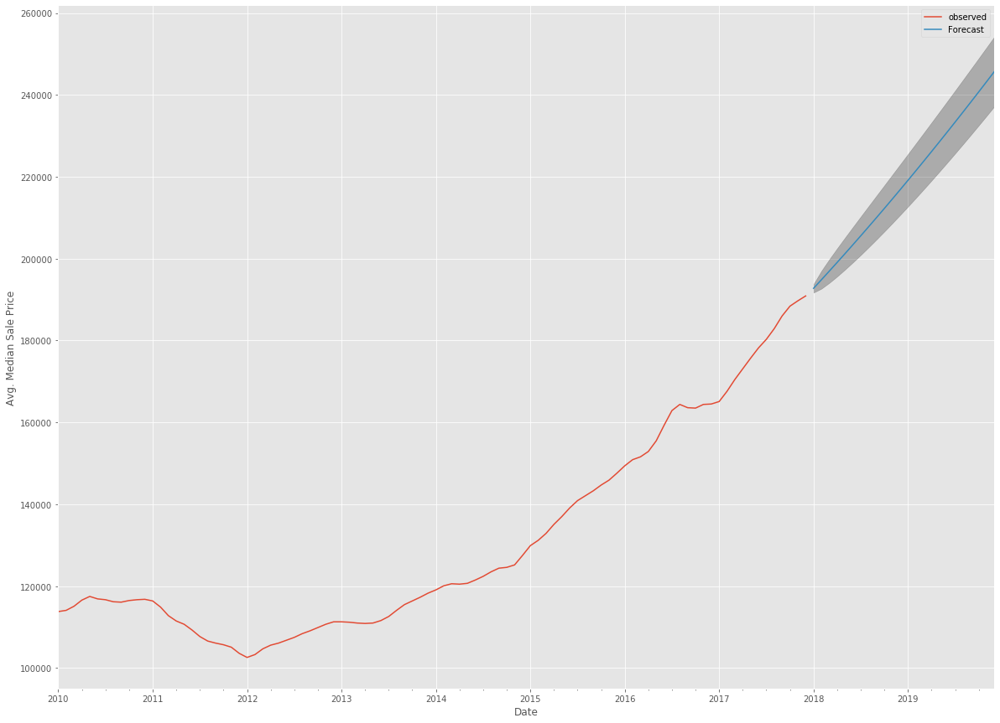

Zipcode:  78721


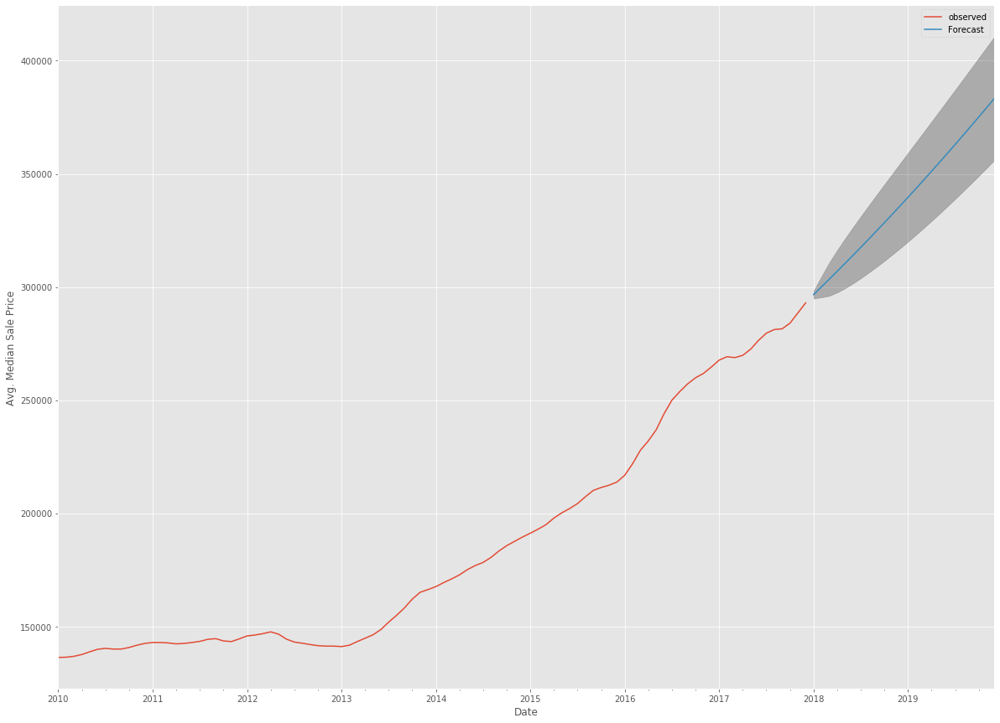

Zipcode:  78753


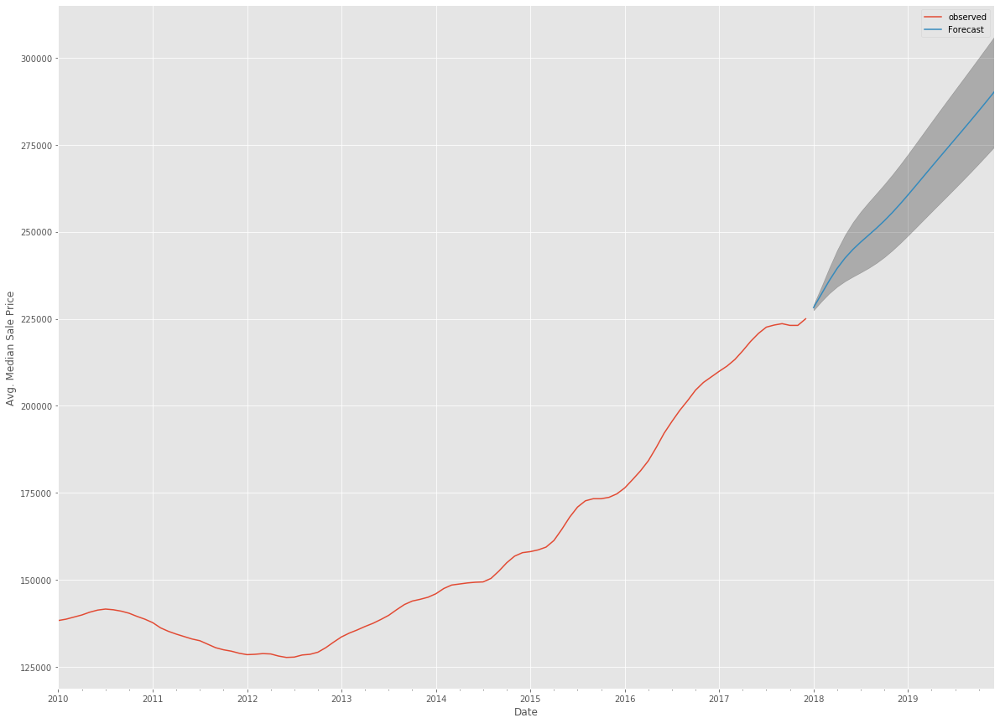

Zipcode:  78741


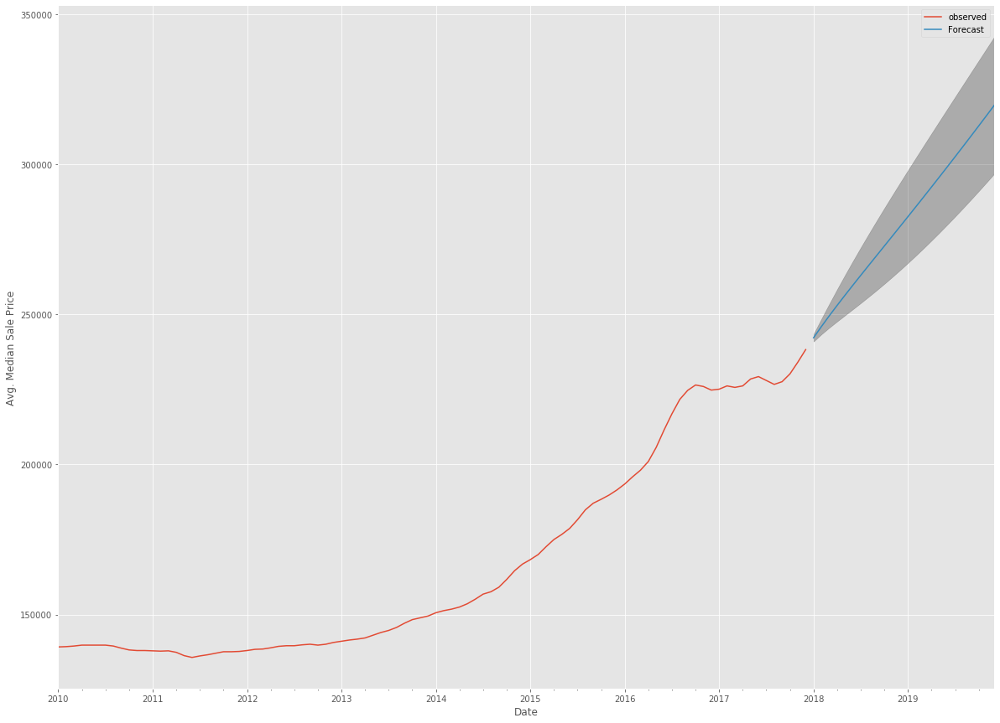

Zipcode:  78724


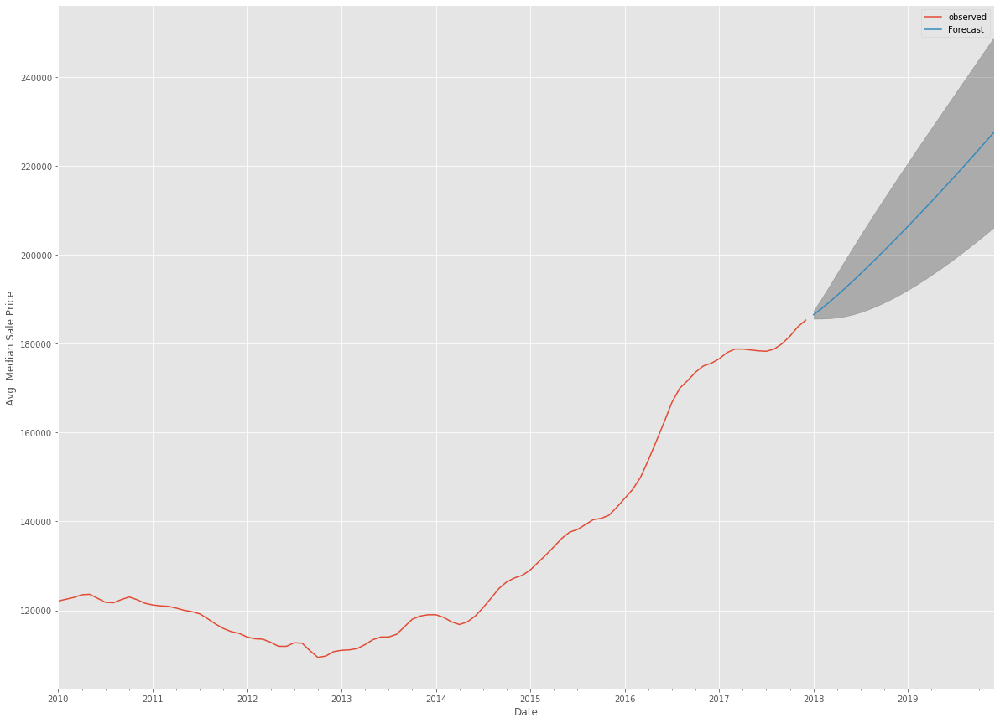

In [501]:
for keys in top_5_dict.keys():
    ts = np.exp(top_5_dict[keys][0])
    order = top_5_dict[keys][1][0]
    seasonal_order = top_5_dict[keys][1][1]
    
    output = arima_fit(ts, order = order, seasonal_order = seasonal_order, plot = None)
    # Get forecast 24 steps ahead in future (2 years)
    prediction_future = output.get_forecast(steps=24)

    # Get confidence intervals of forecasts
    pred_conf = prediction_future.conf_int()

    # Plot future predictions with confidence intervals
    print('Zipcode: ', keys)
    ax = ts.plot(label='observed', figsize=(20, 15))
    prediction_future.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_conf.index,
                    pred_conf.iloc[:, 0],
                    pred_conf.iloc[:, 1], color='k', alpha=0.25)
    #ax.title(title)
    ax.set_xlabel('Date')
    ax.set_ylabel('Avg. Median Sale Price')

    plt.legend()
    plt.show()

In [497]:
pred_conf

,lower 78724,upper 78724
2018-01-01,185602.171464,187447.433545
2018-02-01,185628.660865,190138.554981
2018-03-01,185698.818220,192986.100492
2018-04-01,185871.596576,195882.976182
2018-05-01,186164.198851,198777.854384
2018-06-01,186576.599835,201646.570899
2018-07-01,187101.768274,204479.010269
2018-08-01,187730.242008,207272.480165
2018-09-01,188452.223839,210028.162048
2018-10-01,189258.509276,212749.153126


78724 has the widest confidence interval for its forecasts. Overall, the upper portion of the confidence interval is roughly 14% larger than the lower end.

## Mapping top 5 Zip Codes

In [339]:
#sorting returns_df by two_year_return_%
top_5_zip = returns_df.sort_values(by = 'two_year_returns_(%)', ascending = False).head()

top_5_zip.reset_index(inplace = True)
top_5_zip.drop(columns = 'index', inplace = True)

top_5_zip

In [292]:
#opening austin json geo data
with open('austin_area_zip_codes.geojson', 'r') as austin_zipcodes:
    data = json.load(austin_zipcodes)
tmp = data

In [298]:
#need to grab zipcode property
tmp['features'][1]['properties']

{'geodb_oid': 4,
 'objectid': 4,
 'zipcodes_i': 57,
 'zipcode': '78645',
 'name': 'LEANDER',
 'created_by': None,
 'created_da': None,
 'modified_b': None,
 'modified_d': None,
 'shape_area': 1043395959.57919,
 'shape_len': 196654.442799695,
 'cartodb_id': 4,
 'created_at': '2015-06-07T00:48:14Z',
 'updated_at': '2015-06-07T00:48:14Z'}

In [300]:
#using only top 5 zipcodes
geo_zips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['zipcode'] in list(top_5_zip['Zipcode'].unique()):
        geo_zips.append(tmp['features'][i])
        
#creating new JSON object
new_json = dict.fromkeys(['type', 'features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geo_zips

#save as updated file
open('updated-file.json', 'w').write(
    json.dumps(new_json, indent = 4, separators = (',', ':'), sort_keys = True))

In [355]:
def map_feature_by_zipcode(zipcode_data, col):
    """
     Generates a folium map
     
     Inputs: zipcode_dataset
             col = feature to display
     Output: folium map m
    
    function courtesy of Stephan Osterburg
    https://medium.com/@sosterburg
    """

    # read updated geo data
    austin_geo = "updated-file.json"

    # Initialize Folium Map with Austin latitude and longitude
    m = folium.Map(location=[30.2672, -97.7431], zoom_start=11,
                   detect_retina=True, control_scale=False)

    # Create choropleth map
    m.choropleth(
        geo_data=austin_geo,
        name='choropleth',
        data=zipcode_data,
        # col: feature of interest
        columns=['Zipcode', col],
        key_on='feature.properties.zipcode',
        fill_color='OrRd',
        fill_opacity=0.9,
        line_opacity=0.2,
        legend_name='house ' + col
    )

    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

In [356]:
map_feature_by_zipcode(top_5_zip, 'two_year_returns_(%)')

# Conclusions and Further Analysis

Austin is growing at the fastest rate of any metropolitan area with over 1 million people in the country. New developments are popping up everywhere you look, and more and more young professionals are moving for warmth, no income tax, and a general feeling that it's a city to be in.

The top 5 zipcodes represent areas of the city that don't yet have the major developments of the downtown area. These zipcodes include East Austin, where tons of new restaurants and apartments have been popping up. It also includes the area near the airport, which is seeing its own boom. All of East Austin would experience immense growth if city advocates convince the state to bury I-35 and reconnect downtown with the east part of town. [Reconnect Austin](https://reconnectaustin.com/) is a campaign to remove the racist divider constructed in the 1960s and bring even further revitalization to the rest of the city.

Increased interest in Austin is have the net effect of driving grwoth rates in other major cities in towns in the metro area. the 5 largest cities in the metro area, not including austin (Cedar Park, Leander, Round Rock, Pflugerville, San Marcos), all experienced growth rates near or greater than 40% from 2011 - 2017. The entire metro area is ripe for investment, and a strategic real estate investment firm could make a lot of money here, especially in the 5 zipcodes I recommend.

Future work would include research into why these top 5 zipcodes are growing so fast. What makes a particular zipcode tick? Is it the people and culture, or is it simply cheap properties that developers buy and turn into luxury apartments? Or is it something else completely. This analysis would be key in fleshing out an investment thesis for a real estate investment firm. If we knew what qualities made a particular zipcode more likely to grow than others, the firm could invest early and reap large returns.

What city and state governments should be careful of is further gentrification. Growth rates of over 40% essentially imply that gentrification is ocurring. It's important for cities that historically under-invested communities are brought back to life, but there also has to be a solution that doesn't yet again displace the people who currently live there, especially low-income earners. Governments must ensure there's a way to access affordable housing for people who didn't move to Austin to work a lucrative tech job. Austin has been in the news for the way the state government is treating people experiencing homelessness. Rather than forcing them to move to more dangerous areas, the obviously solution is to just give them homes. Real estate investment should consider these factors as well, not just how fast a zipcode is growing.